In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

## I imported the necessary libraries to start the Intial part of Model Building

In [767]:
df=pd.read_csv('loan.csv',low_memory=False)

## By using the pandas we are reading the dataset which we

In [768]:
df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
0,1077501,1296599,5000,5000,4975.0,36 months,10.65,162.87,B,B2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27,59.83,C,C4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96,84.33,C,C5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49,339.31,C,C1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69,67.79,B,B5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [769]:
df.drop(columns=['funded_amnt', 'funded_amnt_inv','emp_title','desc','mths_since_last_record','mths_since_last_major_derog','annual_inc_joint','dti_joint','verification_status_joint','open_acc_6m','open_il_6m','open_il_12m','open_il_24m','mths_since_rcnt_il','total_bal_il','il_util','open_rv_12m','open_rv_24m','max_bal_bc','all_util','inq_fi','total_cu_tl','inq_last_12m','total_pymnt_inv'],axis=1,inplace=True)
## We deleting the  columns which have more than 75% of NUll vales 

In [770]:
df.dropna(subset=['title','earliest_cr_line','open_acc','pub_rec','revol_util','total_acc','last_pymnt_d',
'last_credit_pull_d','collections_12_mths_ex_med','acc_now_delinq','tot_coll_amt','tot_cur_bal','total_rev_hi_lim'], inplace=True)
## We deleting the row which have neglectable of NUll vales

In [771]:
df['emp_length'].fillna(0,inplace=True)
## Filling the Null values inthe emp_length column with 0.

In [772]:
df.drop(columns=['id','member_id','title','sub_grade','url','zip_code','mths_since_last_delinq', 'total_rec_late_fee', 'recoveries','out_prncp', 'out_prncp_inv','next_pymnt_d', 'last_credit_pull_d', 'collections_12_mths_ex_med',
       'policy_code', 'initial_list_status','application_type', 'acc_now_delinq','pymnt_plan','total_rec_prncp','last_pymnt_d','last_pymnt_amnt', 'tot_coll_amt','tot_cur_bal', 'total_rev_hi_lim','collection_recovery_fee'],axis=1,inplace=True)
## dropping unnecessary columns

In [773]:
df.drop('earliest_cr_line',axis=1,inplace=True)

In [774]:
df = df[df.loan_status != 'Current']
df = df[df.loan_status != 'In Grace Period']
df = df[df.loan_status != 'Late (16-30 days)']
df = df[df.loan_status != 'Late (31-120 days)']
df = df[df.loan_status != 'Does not meet the credit policy. Status:Fully Paid']
df = df[df.loan_status != 'Does not meet the credit policy. Status:Charged Off']
df = df[df.loan_status != 'Issued']
## dropping the unnecessary categories in the target variable as we are going to predict the Fully paid and Default Rate

In [775]:
df['verification_status']= df['verification_status'].replace({'Source Verified':'Verified'})
## Changing the Source Verified to Verified

In [776]:
df['loan_status'] = df['loan_status'].replace({'Charged Off':'Default'})
## Changing the Charged off to Default

In [777]:
df.reset_index(inplace=True)
#Resting the index

In [778]:
df.drop('index',axis=1,inplace=True)

In [779]:
df['issue_d']=pd.to_datetime(df['issue_d']).dt.year
## Changing the issue_date column datatype object to integer by changing into year

In [780]:
df["emp_length"] = df["emp_length"].replace({'years':'','year':'',' ':'','<':'','\+':'','n/a':'0'}, regex = True)
df["emp_length"] = df["emp_length"].apply(lambda x:int(x))
## Chaning the Emp_length object to integer and removing the symbols in the column

In [781]:
df['home_ownership'].replace(['NONE', 'ANY','OTHER'], 'RENT', inplace=True)

In [782]:
df['grade'] = df['grade'].map({'A':7,'B':6,'C':5,'D':4,'E':3,'F':2,'G':1})

In [783]:
q1=df['dti'].quantile(.25)
q3=df['dti'].quantile(.75)
IQR=q3-q1
UL=q3+1.5*IQR
LL=q1-1.5*IQR
print('q1',q1,'\n''q3',q3,'\n''IQR',IQR,'\n''UL',UL,'\n''LL',LL)
print('No.of Outliers are present - ',len(df[(df['dti']<LL) | (df['dti']>UL )]))
df=df[(df['dti']>LL) & (df['dti']<UL )]

q1 11.41 
q3 22.96 
IQR 11.55 
UL 40.285000000000004 
LL -5.915000000000003
No.of Outliers are present -  1


In [784]:
q1=df['revol_util'].quantile(.25)
q3=df['revol_util'].quantile(.75)
IQR=q3-q1
UL=q3+1.5*IQR
LL=q1-1.5*IQR
print('q1',q1,'\n''q3',q3,'\n''IQR',IQR,'\n''UL',UL,'\n''LL',LL)
print('No.of Outliers are present - ',len(df[(df['revol_util']<LL) | (df['revol_util']>UL )]))
df=df[(df['revol_util']>LL) & (df['revol_util']<UL )]

q1 37.9 
q3 73.7 
IQR 35.800000000000004 
UL 127.4 
LL -15.800000000000004
No.of Outliers are present -  8


In [785]:
print(df['int_rate'].quantile(.25))
print(df['int_rate'].quantile(.75))
q1=df['int_rate'].quantile(.25)
q3=df['int_rate'].quantile(.75)
IQR=q3-q1
UL=q3+1.5*IQR
LL=q1-1.5*IQR
print(UL)
print(LL)
print(df['int_rate'].max())
print(df['int_rate'].min())
df['int_rate']=np.where((df['int_rate']>UL),UL,df['int_rate'])

11.14
17.27
26.464999999999996
1.945000000000002
28.99
5.32


In [786]:
print(df['installment'].quantile(.25))
print(df['installment'].quantile(.75))
q1=df['installment'].quantile(.25)
q3=df['installment'].quantile(.75)
IQR=q3-q1
UL=q3+1.5*IQR
LL=q1-1.5*IQR
print(UL)
print(LL)
print(df['installment'].max())
print(df['installment'].min())
df['installment']=np.where((df['installment']>UL),UL,df['installment'])

262.45
573.7
1040.5750000000003
-204.42500000000013
1424.57
27.85


In [787]:
print(df['annual_inc'].quantile(.25))
print(df['annual_inc'].quantile(.75))
q1=df['annual_inc'].quantile(.25)
q3=df['annual_inc'].quantile(.75)
IQR=q3-q1
UL=q3+1.5*IQR
LL=q1-1.5*IQR
print(UL)
print(LL)
print(df['annual_inc'].max())
print(df['annual_inc'].min())
df['annual_inc']=np.where((df['annual_inc']>UL),UL,df['annual_inc'])

45700.0
90000.0
156450.0
-20750.0
8706582.0
3000.0


In [788]:
print(df['inq_last_6mths'].quantile(.25))
print(df['inq_last_6mths'].quantile(.75))
q1=df['inq_last_6mths'].quantile(.25)
q3=df['inq_last_6mths'].quantile(.75)
IQR=q3-q1
UL=q3+1.5*IQR
LL=q1-1.5*IQR
print(UL)
print(LL)
print(df['inq_last_6mths'].max())
print(df['inq_last_6mths'].min())
df['inq_last_6mths']=np.where((df['inq_last_6mths']>UL),UL,df['inq_last_6mths'])

0.0
1.0
2.5
-1.5
7.0
0.0


In [789]:
print(df['open_acc'].quantile(.25))
print(df['open_acc'].quantile(.75))
q1=df['open_acc'].quantile(.25)
q3=df['open_acc'].quantile(.75)
IQR=q3-q1
UL=q3+1.5*IQR
LL=q1-1.5*IQR
print(UL)
print(LL)
print(df['open_acc'].max())
print(df['open_acc'].min())
df['open_acc']=np.where((df['open_acc']>UL),UL,df['open_acc'])

8.0
14.0
23.0
-1.0
76.0
1.0


In [790]:
print(df['revol_bal'].quantile(.25))
print(df['revol_bal'].quantile(.75))
q1=df['revol_bal'].quantile(.25)
q3=df['revol_bal'].quantile(.75)
IQR=q3-q1
UL=q3+1.5*IQR
LL=q1-1.5*IQR
print(UL)
print(LL)
print(df['revol_bal'].max())
print(df['revol_bal'].min())
df['revol_bal']=np.where((df['revol_bal']>UL),UL,df['revol_bal'])

6252.0
19573.0
39554.5
-13729.5
1746716
0


In [791]:
q1=df['total_acc'].quantile(.25)
q3=df['total_acc'].quantile(.75)
IQR=q3-q1
UL=q3+1.5*IQR
LL=q1-1.5*IQR
print(UL)
print(LL)
print(df['total_acc'].max())
print(df['total_acc'].min())
df['total_acc']=np.where((df['total_acc']>UL),UL,df['total_acc'])

57.0
-7.0
150.0
2.0


In [792]:
q1=df['total_pymnt'].quantile(.25)
q3=df['total_pymnt'].quantile(.75)
IQR=q3-q1
UL=q3+1.5*IQR
LL=q1-1.5*IQR
print(UL)
print(LL)
print(df['total_pymnt'].max())
print(df['total_pymnt'].min())
df['total_pymnt']=np.where((df['total_pymnt']>UL),UL,df['total_pymnt'])

38398.05900912499
-12495.138601874996
56087.90992
0.0


In [793]:
q1=df['total_rec_int'].quantile(.25)
q3=df['total_rec_int'].quantile(.75)
IQR=q3-q1
UL=q3+1.5*IQR
LL=q1-1.5*IQR
print(UL)
print(LL)
print(df['total_rec_int'].max())
print(df['total_rec_int'].min())
df['total_rec_int']=np.where((df['total_rec_int']>UL),UL,df['total_rec_int'])

5122.458750000001
-2098.6312500000004
21087.91
0.0


In [794]:
q1=df['pub_rec'].quantile(.25)
q3=df['pub_rec'].quantile(.75)
IQR=q3-q1
UL=q3+1.5*IQR
LL=q1-1.5*IQR
print(UL)
print(LL)
print(df['pub_rec'].max())
print(df['pub_rec'].min())
df['pub_rec']=np.where((df['pub_rec']>0),0,df['pub_rec'])

0.0
0.0
15.0
0.0


In [795]:
q1=df['delinq_2yrs'].quantile(.25)
q3=df['delinq_2yrs'].quantile(.75)
IQR=q3-q1
UL=q3+1.5*IQR
LL=q1-1.5*IQR
print(UL)
print(LL)
print(df['delinq_2yrs'].max())
print(df['delinq_2yrs'].min())
df['delinq_2yrs']=np.where((df['delinq_2yrs']>0),0,df['delinq_2yrs'])

0.0
0.0
29.0
0.0


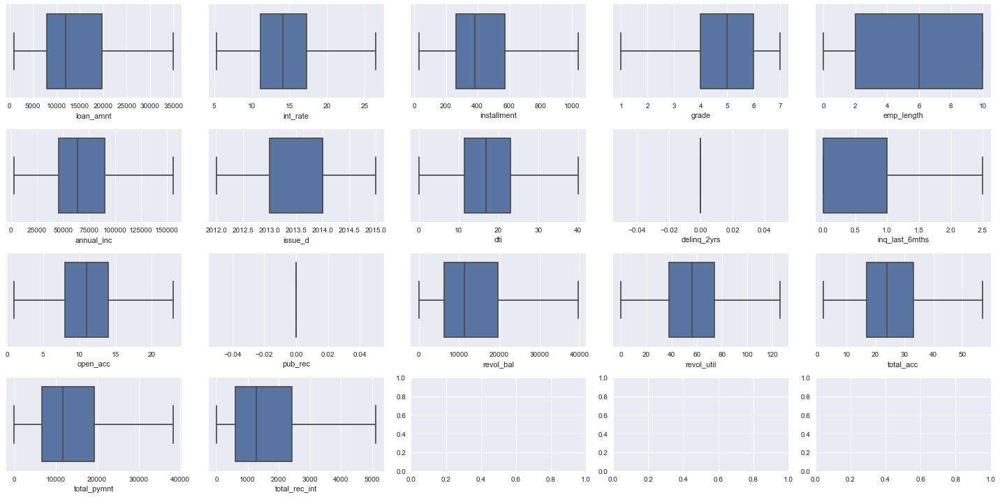

In [796]:
#create box plots
fig,ax = plt.subplots(ncols=5,nrows=4,figsize=(20,10))
index=0
ax=ax.flatten()

for i in df.columns: ## Visualization of Outliers
    if df[i].dtypes != 'object':
        sns.boxplot(df[i],ax=ax[index])
        plt.tight_layout()
        index+=1

In [797]:
cat_cols=df.select_dtypes(include='O')
num_cols=df.select_dtypes(include='number')

In [798]:
cat_cols.columns

Index(['term', 'home_ownership', 'verification_status', 'loan_status',
       'purpose', 'addr_state'],
      dtype='object')

In [799]:
num_cols.columns

Index(['loan_amnt', 'int_rate', 'installment', 'grade', 'emp_length',
       'annual_inc', 'issue_d', 'dti', 'delinq_2yrs', 'inq_last_6mths',
       'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc',
       'total_pymnt', 'total_rec_int'],
      dtype='object')

## Categorical Input and Categorical Output ---- Statistical Test


#### H0 : The Feature is not Significant to target variable

#### H1 : The Feature is Significant to target variable



In [33]:
import scipy.stats as st

In [34]:
for i in cat_cols.columns:
    ct=pd.crosstab(df['loan_status'],df[i])
    print('chi-square test for ',i,'p-value is ', st.chi2_contingency(ct)[1])
    print('\n')

chi-square test for  term p-value is  0.0


chi-square test for  home_ownership p-value is  1.1246615927354768e-180


chi-square test for  verification_status p-value is  1.4192164537859653e-208


chi-square test for  loan_status p-value is  0.0


chi-square test for  purpose p-value is  8.527509667001195e-109


chi-square test for  addr_state p-value is  1.1590288119476938e-83




# Numerical Input and Categorical Output ---- Statistical Test

#### H0 : The Feature is not skewed
#### H1 : The Feature is skewed

In [35]:
for i in num_cols:
    g1= df[df['loan_status']=='Fully Paid'][i]
    g2= df[df['loan_status']=='Default'][i]
    from scipy.stats import shapiro
    print('shapiro test for normallity',i,shapiro(g1))
    print('shapiro test for normallity',i,shapiro(g2))
    print('\n')

shapiro test for normallity loan_amnt ShapiroResult(statistic=0.9382550716400146, pvalue=0.0)
shapiro test for normallity loan_amnt ShapiroResult(statistic=0.9475676417350769, pvalue=0.0)


shapiro test for normallity int_rate ShapiroResult(statistic=0.9831830859184265, pvalue=0.0)
shapiro test for normallity int_rate ShapiroResult(statistic=0.991270124912262, pvalue=9.401171267308765e-41)


shapiro test for normallity installment ShapiroResult(statistic=0.9456192851066589, pvalue=0.0)
shapiro test for normallity installment ShapiroResult(statistic=0.950354278087616, pvalue=0.0)


shapiro test for normallity grade ShapiroResult(statistic=0.9091863036155701, pvalue=0.0)
shapiro test for normallity grade ShapiroResult(statistic=0.939429521560669, pvalue=0.0)


shapiro test for normallity emp_length ShapiroResult(statistic=0.8547338843345642, pvalue=0.0)
shapiro test for normallity emp_length ShapiroResult(statistic=0.8631613254547119, pvalue=0.0)


shapiro test for normallity annual_inc 

#### H0 : The Feature has no effect on target variable
#### H1 : The Feature has effect on target variable

In [36]:
para=df[['delinq_2yrs','pub_rec']]
nonpara=df[['int_rate','dti','loan_amnt', 'installment', 'emp_length', 'annual_inc',
       'issue_d', 'inq_last_6mths', 'open_acc','revol_bal', 'revol_util', 'total_acc', 'total_pymnt','total_rec_int']]

In [37]:
from scipy.stats import mannwhitneyu

In [38]:
for i in nonpara.columns:
    g1= df[df['loan_status']=='Fully Paid'][i]
    g2= df[df['loan_status']=='Default'][i]
    print('Mannwhitneyu test for',i,'p-value is',mannwhitneyu(g1,g2))
    print('\n')

Mannwhitneyu test for int_rate p-value is MannwhitneyuResult(statistic=1796985961.0, pvalue=0.0)


Mannwhitneyu test for dti p-value is MannwhitneyuResult(statistic=2267601177.0, pvalue=0.0)


Mannwhitneyu test for loan_amnt p-value is MannwhitneyuResult(statistic=2563147076.5, pvalue=2.2806044988627306e-106)


Mannwhitneyu test for installment p-value is MannwhitneyuResult(statistic=2591111166.0, pvalue=8.872662008676912e-80)


Mannwhitneyu test for emp_length p-value is MannwhitneyuResult(statistic=2646294755.0, pvalue=2.4003363202969117e-40)


Mannwhitneyu test for annual_inc p-value is MannwhitneyuResult(statistic=2335610358.0, pvalue=0.0)


Mannwhitneyu test for issue_d p-value is MannwhitneyuResult(statistic=2674444062.5, pvalue=2.6966735160460183e-26)


Mannwhitneyu test for inq_last_6mths p-value is MannwhitneyuResult(statistic=2572013071.5, pvalue=1.647576927806528e-113)


Mannwhitneyu test for open_acc p-value is MannwhitneyuResult(statistic=2733000381.0, pvalue=9.76343584368

In [39]:
for i in para.columns:
    g1= df[df['loan_status']=='Fully Paid'][i]
    g2= df[df['loan_status']=='Default'][i]
    print('Two sample t-test for',i,'p-value is',st.ttest_ind(g1,g2))
    print('\n')

Two sample t-test for delinq_2yrs p-value is Ttest_indResult(statistic=nan, pvalue=nan)


Two sample t-test for pub_rec p-value is Ttest_indResult(statistic=nan, pvalue=nan)




In [40]:
df.drop(columns=['delinq_2yrs','pub_rec'],axis=1,inplace=True)

In [41]:
df= pd.get_dummies(columns=['term', 'home_ownership', 'verification_status',
       'purpose', 'addr_state'],data=df, drop_first=True)
df['loan_status']=df['loan_status'].replace({'Fully Paid':0,'Default':1})

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [4]:
df1=pd.read_csv('file2.csv',low_memory=False)

In [5]:
X=df1.drop('loan_status',axis=1)
y=df1['loan_status']

In [6]:
from sklearn.model_selection import train_test_split 
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.3,random_state=42)

----------------------------------------------------------------------------------------------------------------------------

In [10]:
from sklearn.metrics import confusion_matrix,classification_report,roc_curve,roc_auc_score,precision_score,recall_score,accuracy_score,f1_score,auc

In [337]:
df_metrics=pd.DataFrame(columns=['model','Accuracy','Precision','Recall','F1 score','AUC','Roc_auc_score'])
def update_metrics(m,acc,prec,rec,f1,auc,roc,i):
    df_metrics.loc[i]=(m,acc,prec,rec,f1,auc,roc)

In [7]:
###Logistic with sklearn
from sklearn.linear_model import LogisticRegression 
Lr=LogisticRegression()
Lr.fit(X_train, y_train)
y_pred_testlr1 =Lr.predict(X_test)
y_pred_trainlr1 =Lr.predict(X_train)

In [8]:
y_problr1=Lr.predict_proba(X_test)
y_problr1

array([[9.74843079e-01, 2.51569212e-02],
       [9.99988612e-01, 1.13882821e-05],
       [9.89455276e-01, 1.05447238e-02],
       ...,
       [9.95981036e-01, 4.01896415e-03],
       [1.86637881e-03, 9.98133621e-01],
       [9.68919312e-01, 3.10806883e-02]])

In [11]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testlr1))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_trainlr1))

Test Confusion  Matrix :  
 [[46018   123]
 [  390 10433]]


Train Confusion  Matrix :  
 [[107488    286]
 [   988  24154]]


In [12]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testlr1))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_trainlr1))

Test Classification Report :  
               precision    recall  f1-score   support

           0       0.99      1.00      0.99     46141
           1       0.99      0.96      0.98     10823

    accuracy                           0.99     56964
   macro avg       0.99      0.98      0.99     56964
weighted avg       0.99      0.99      0.99     56964

Train Classification Report :  
               precision    recall  f1-score   support

           0       0.99      1.00      0.99    107774
           1       0.99      0.96      0.97     25142

    accuracy                           0.99    132916
   macro avg       0.99      0.98      0.98    132916
weighted avg       0.99      0.99      0.99    132916



In [13]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_trainlr1),end="      ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testlr1))
print('Train Precision : ', precision_score(y_train,y_pred_trainlr1),end="     ")
print('Test Precision : ', precision_score(y_test,y_pred_testlr1))
print('Train Recall : ', recall_score(y_train,y_pred_trainlr1),end="        ")
print('Test Recall : ', recall_score(y_test,y_pred_testlr1))

Train Accuracy :  0.9904149989467032      Test Accuracy :  0.9909943121971772
Train Precision :  0.9882978723404255     Test Precision :  0.9883478590375142
Train Recall :  0.9607032057911065        Test Recall :  0.9639656287535804


In [15]:
print('Train F1_score : ', f1_score(y_train,y_pred_trainlr1),end="        ")
print('Test F1_score : ', f1_score(y_test,y_pred_testlr1))

Train F1_score :  0.9743051914001049        Test F1_score :  0.9760044903877637


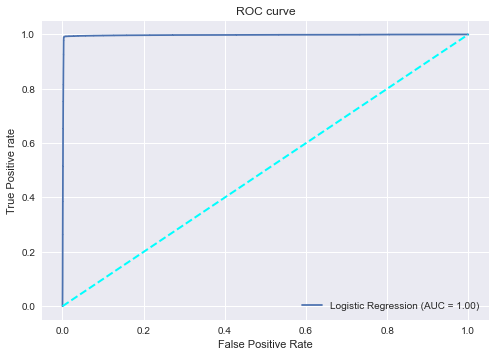

In [421]:
fpr, tpr, thresholds = roc_curve(y_test, y_problr1[:,1])
au1=auc(fpr, tpr)
plt.plot(fpr,tpr,label='Logistic Regression (AUC = {0:0.2f})'.format(au1))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right")
plt.show()

In [496]:
asc=accuracy_score(y_test,y_pred_testlr1)
ps=precision_score(y_test,y_pred_testlr1)
rs=recall_score(y_test,y_pred_testlr1)
fs=f1_score(y_test,y_pred_testlr1)
roc1=roc_auc_score(y_test,y_problr1[:,1])

In [497]:
update_metrics("Model_logistic",asc,ps,rs,fs,au1,roc1,0)

In [802]:
###Decesion Tree
from sklearn.tree import DecisionTreeClassifier
Dt= DecisionTreeClassifier()
Dt.fit(X_train,y_train)
y_pred_testdt1 = Dt.predict(X_test)
y_pred_traindt1 =Dt.predict(X_train)

In [803]:
y_probdt1=Dt.predict_proba(X_test)
y_probdt1

array([[1., 0.],
       [1., 0.],
       [1., 0.],
       ...,
       [1., 0.],
       [0., 1.],
       [1., 0.]])

In [804]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testdt1))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_traindt1))

Test Confusion  Matrix :  
 [[45899   242]
 [  264 10559]]


Train Confusion  Matrix :  
 [[107774      0]
 [     0  25142]]


In [805]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testdt1))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_traindt1))

Test Classification Report :  
               precision    recall  f1-score   support

           0       0.99      0.99      0.99     46141
           1       0.98      0.98      0.98     10823

    accuracy                           0.99     56964
   macro avg       0.99      0.99      0.99     56964
weighted avg       0.99      0.99      0.99     56964

Train Classification Report :  
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    107774
           1       1.00      1.00      1.00     25142

    accuracy                           1.00    132916
   macro avg       1.00      1.00      1.00    132916
weighted avg       1.00      1.00      1.00    132916



In [806]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_traindt1),end="      ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testdt1))
print('Train Precision : ', precision_score(y_train,y_pred_traindt1),end="     ")
print('Test Precision : ', precision_score(y_test,y_pred_testdt1))
print('Train Recall : ', recall_score(y_train,y_pred_traindt1),end="        ")
print('Test Recall : ', recall_score(y_test,y_pred_testdt1))

Train Accuracy :  1.0      Test Accuracy :  0.9911171968260656
Train Precision :  1.0     Test Precision :  0.9775946671604481
Train Recall :  1.0        Test Recall :  0.9756075025408851


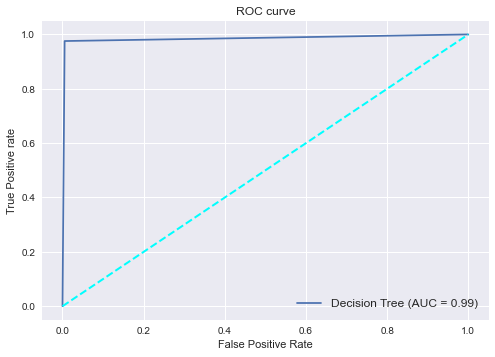

In [807]:
fpr, tpr, thresholds = roc_curve(y_test, y_probdt1[:,1])
au2=auc(fpr, tpr)
plt.plot(fpr,tpr,label='Decision Tree (AUC = {0:0.2f})'.format(au2))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [808]:
asc=accuracy_score(y_test,y_pred_testdt1)
ps=precision_score(y_test,y_pred_testdt1)
rs=recall_score(y_test,y_pred_testdt1)
fs=f1_score(y_test,y_pred_testdt1)
roc2=roc_auc_score(y_test,y_probdt1[:,1])

In [495]:
update_metrics("Model_Desicion-Tree",asc,ps,rs,fs,au2,roc2,1)

In [814]:
from sklearn.tree import export_graphviz
from six import StringIO 
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(Dt, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = X_train.columns,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('loan.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.587485 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.587485 to fit



In [816]:
from sklearn import tree

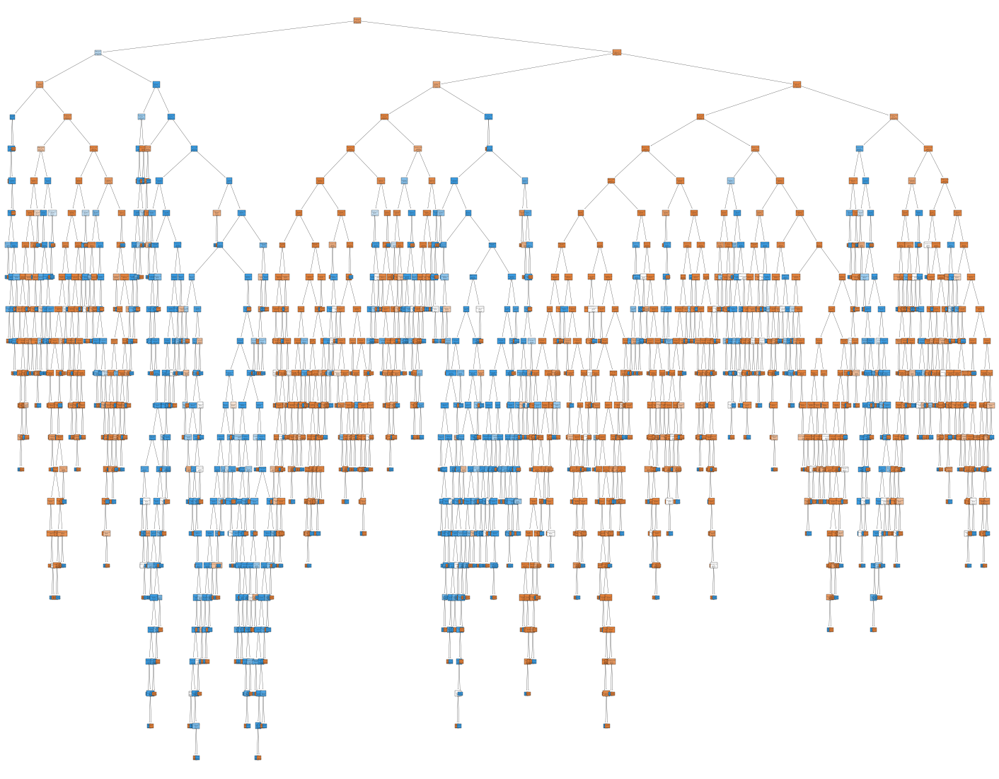

In [817]:
fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(Dt, 
                   feature_names=X_train.columns,  
                   class_names=['0','1'],
                   filled=True)

In [818]:
import graphviz
# DOT data
dot_data = tree.export_graphviz(Dt, out_file=None, 
                                feature_names=X_train.columns,  
                                class_names=['0','1'],
                                filled=True)

# Draw graph
graph = graphviz.Source(dot_data, format="png") 
graph

In [470]:
###Navie Bayes
from sklearn.naive_bayes import GaussianNB
nb=GaussianNB()
nb.fit(X_train,y_train)
y_pred_testnb1 = nb.predict(X_test)
y_pred_trainnb1 = nb.predict(X_train)

In [476]:
y_probnb1=nb.predict_proba(X_test)
y_probnb1

array([[7.59505170e-01, 2.40494830e-01],
       [9.99920308e-01, 7.96923190e-05],
       [4.02325112e-01, 5.97674888e-01],
       ...,
       [9.68618414e-01, 3.13815857e-02],
       [8.41960737e-01, 1.58039263e-01],
       [5.81078732e-01, 4.18921268e-01]])

In [471]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testnb1))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_trainnb1))

Test Confusion  Matrix :  
 [[43343  2798]
 [ 5598  5225]]


Train Confusion  Matrix :  
 [[101389   6385]
 [ 12957  12185]]


In [472]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testnb1))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_trainnb1))

Test Classification Report :  
               precision    recall  f1-score   support

           0       0.89      0.94      0.91     46141
           1       0.65      0.48      0.55     10823

    accuracy                           0.85     56964
   macro avg       0.77      0.71      0.73     56964
weighted avg       0.84      0.85      0.84     56964

Train Classification Report :  
               precision    recall  f1-score   support

           0       0.89      0.94      0.91    107774
           1       0.66      0.48      0.56     25142

    accuracy                           0.85    132916
   macro avg       0.77      0.71      0.74    132916
weighted avg       0.84      0.85      0.85    132916



In [475]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_trainnb1),end="     ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testnb1))
print('Train Precision : ', precision_score(y_train,y_pred_trainnb1),end="     ")
print('Test Precision : ', precision_score(y_test,y_pred_testnb1))
print('Train Recall : ', recall_score(y_train,y_pred_trainnb1),end="      ")
print('Test Recall : ', recall_score(y_test,y_pred_testnb1))

Train Accuracy :  0.8544795209004183     Test Accuracy :  0.8526086651218313
Train Precision :  0.656165858912224     Test Precision :  0.6512526486351738
Train Recall :  0.48464720388195054      Test Recall :  0.4827681788783147


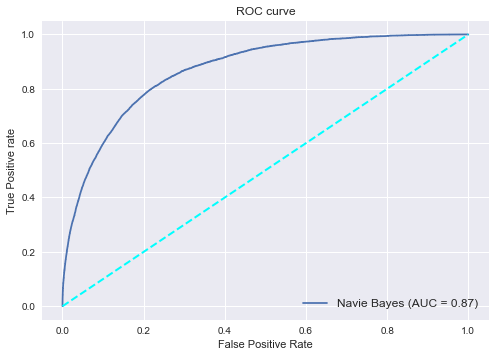

In [478]:
fpr, tpr, thresholds = roc_curve(y_test, y_probnb1[:,1])
au3=auc(fpr, tpr)
plt.plot(fpr,tpr,label='Navie Bayes (AUC = {0:0.2f})'.format(au3))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [499]:
asc=accuracy_score(y_test,y_pred_testnb1)
ps=precision_score(y_test,y_pred_testnb1)
rs=recall_score(y_test,y_pred_testnb1)
fs=f1_score(y_test,y_pred_testnb1)
roc3=roc_auc_score(y_test,y_probnb1[:,1])

In [500]:
update_metrics("Model_Navie_Bayes",asc,ps,rs,fs,au3,roc3,2)

In [483]:
###Random Forest
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier()
rf.fit(X_train, y_train)
y_pred_testrf1 = rf.predict(X_test)
y_pred_trainrf1 = rf.predict(X_train)

In [482]:
y_probrf1=rf.predict_proba(X_test)
y_probrf1

array([[0.99, 0.01],
       [0.99, 0.01],
       [0.85, 0.15],
       ...,
       [0.92, 0.08],
       [0.4 , 0.6 ],
       [0.94, 0.06]])

In [484]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testrf1))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_trainrf1))

Test Confusion  Matrix :  
 [[46040   101]
 [  963  9860]]


Train Confusion  Matrix :  
 [[107774      0]
 [     0  25142]]


In [485]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testrf1))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_trainrf1))

Test Classification Report :  
               precision    recall  f1-score   support

           0       0.98      1.00      0.99     46141
           1       0.99      0.91      0.95     10823

    accuracy                           0.98     56964
   macro avg       0.98      0.95      0.97     56964
weighted avg       0.98      0.98      0.98     56964

Train Classification Report :  
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    107774
           1       1.00      1.00      1.00     25142

    accuracy                           1.00    132916
   macro avg       1.00      1.00      1.00    132916
weighted avg       1.00      1.00      1.00    132916



In [488]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_trainrf1),end="    ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testrf1))
print('Train Precision : ', precision_score(y_train,y_pred_trainrf1),end="   ")
print('Test Precision : ', precision_score(y_test,y_pred_testrf1))
print('Train Recall : ', recall_score(y_train,y_pred_trainrf1),end="      ")
print('Test Recall : ', recall_score(y_test,y_pred_testrf1))

Train Accuracy :  1.0    Test Accuracy :  0.98132153640896
Train Precision :  1.0   Test Precision :  0.9898604557775323
Train Recall :  1.0      Test Recall :  0.9110228217684561


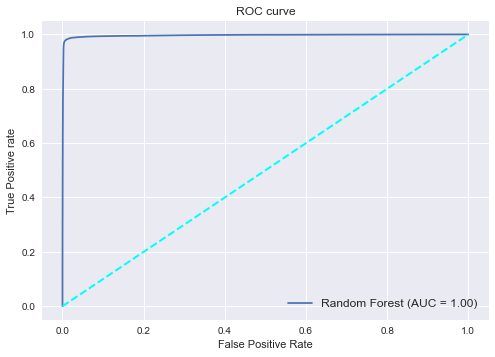

In [490]:
fpr, tpr, thresholds = roc_curve(y_test, y_probrf1[:,1])
au4=auc(fpr, tpr)
plt.plot(fpr,tpr, label='Random Forest (AUC = {0:0.2f})'.format(au4))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [501]:
asc=accuracy_score(y_test,y_pred_testrf1)
ps=precision_score(y_test,y_pred_testrf1)
rs=recall_score(y_test,y_pred_testrf1)
fs=f1_score(y_test,y_pred_testrf1)
roc4=roc_auc_score(y_test,y_probrf1[:,1])

In [502]:
update_metrics("Model_Random_Forest",asc,ps,rs,fs,au4,roc4,3)

In [503]:
###KNN
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train_sc = sc.fit_transform(X_train) 
X_test_sc = sc.transform(X_test)

In [505]:
from sklearn.neighbors import KNeighborsClassifier
kn=KNeighborsClassifier(n_neighbors = 5)
kn.fit(X_train_sc, y_train)
y_pred_testkn1= kn.predict(X_test_sc)
y_pred_trainkn1= kn.predict(X_train_sc)

In [507]:
y_probkn1=kn.predict_proba(X_test_sc)
y_probkn1

array([[1. , 0. ],
       [1. , 0. ],
       [0.4, 0.6],
       ...,
       [1. , 0. ],
       [0.4, 0.6],
       [0.6, 0.4]])

In [508]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testkn1))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_trainkn1))

Test Confusion  Matrix :  
 [[44851  1290]
 [ 7288  3535]]


Train Confusion  Matrix :  
 [[106312   1462]
 [ 13011  12131]]


In [509]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testkn1))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_trainkn1))

Test Classification Report :  
               precision    recall  f1-score   support

           0       0.86      0.97      0.91     46141
           1       0.73      0.33      0.45     10823

    accuracy                           0.85     56964
   macro avg       0.80      0.65      0.68     56964
weighted avg       0.84      0.85      0.83     56964

Train Classification Report :  
               precision    recall  f1-score   support

           0       0.89      0.99      0.94    107774
           1       0.89      0.48      0.63     25142

    accuracy                           0.89    132916
   macro avg       0.89      0.73      0.78    132916
weighted avg       0.89      0.89      0.88    132916



In [510]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_trainkn1),end="    ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testkn1))
print('Train Precision : ', precision_score(y_train,y_pred_trainkn1),end="   ")
print('Test Precision : ', precision_score(y_test,y_pred_testkn1))
print('Train Recall : ', recall_score(y_train,y_pred_trainkn1),end="      ")
print('Test Recall : ', recall_score(y_test,y_pred_testkn1))

Train Accuracy :  0.8911116795570134    Test Accuracy :  0.8494136647707324
Train Precision :  0.8924446406238505   Test Precision :  0.7326424870466322
Train Recall :  0.4824994033887519      Test Recall :  0.32661923681049615


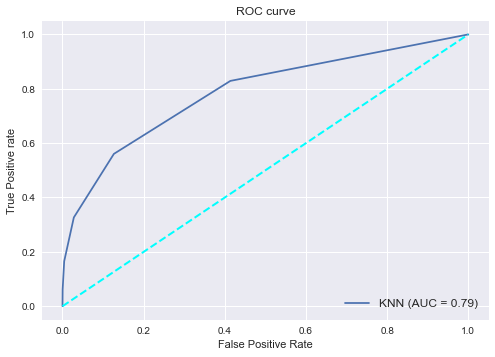

In [511]:
fpr, tpr, thresholds = roc_curve(y_test, y_probkn1[:,1])
au5=auc(fpr, tpr)
plt.plot(fpr,tpr, label='KNN (AUC = {0:0.2f})'.format(au5))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [512]:
asc=accuracy_score(y_test,y_pred_testkn1)
ps=precision_score(y_test,y_pred_testkn1)
rs=recall_score(y_test,y_pred_testkn1)
fs=f1_score(y_test,y_pred_testkn1)
roc5=roc_auc_score(y_test,y_probkn1[:,1])

In [513]:
update_metrics("Model_KNN",asc,ps,rs,fs,au5,roc5,4)

In [514]:
###Xgboost
from xgboost import XGBClassifier
xg = XGBClassifier(eval_metric='logloss')
xg.fit(X_train, y_train)
y_pred_testxg1 = xg.predict(X_test)
y_pred_trainxg1 = xg.predict(X_train)

In [515]:
y_probxg1=xg.predict_proba(X_test)
y_probxg1

array([[9.9874783e-01, 1.2521578e-03],
       [9.9987465e-01, 1.2535209e-04],
       [9.9990362e-01, 9.6355128e-05],
       ...,
       [9.9929702e-01, 7.0298091e-04],
       [1.7267466e-04, 9.9982733e-01],
       [9.9978703e-01, 2.1295859e-04]], dtype=float32)

In [516]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testxg1))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_trainxg1))

Test Confusion  Matrix :  
 [[46017   124]
 [  137 10686]]


Train Confusion  Matrix :  
 [[107702     72]
 [    68  25074]]


In [517]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testxg1))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_trainxg1))

Test Classification Report :  
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     46141
           1       0.99      0.99      0.99     10823

    accuracy                           1.00     56964
   macro avg       0.99      0.99      0.99     56964
weighted avg       1.00      1.00      1.00     56964

Train Classification Report :  
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    107774
           1       1.00      1.00      1.00     25142

    accuracy                           1.00    132916
   macro avg       1.00      1.00      1.00    132916
weighted avg       1.00      1.00      1.00    132916



In [519]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_trainxg1),end="    ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testxg1))
print('Train Precision : ', precision_score(y_train,y_pred_trainxg1),end="   ")
print('Test Precision : ', precision_score(y_test,y_pred_testxg1))
print('Train Recall : ', recall_score(y_train,y_pred_trainxg1),end="       ")
print('Test Recall : ', recall_score(y_test,y_pred_testxg1))

Train Accuracy :  0.9989467031809564    Test Accuracy :  0.9954181588371603
Train Precision :  0.9971367215461704   Test Precision :  0.9885291396854764
Train Recall :  0.997295362341898       Test Recall :  0.9873417721518988


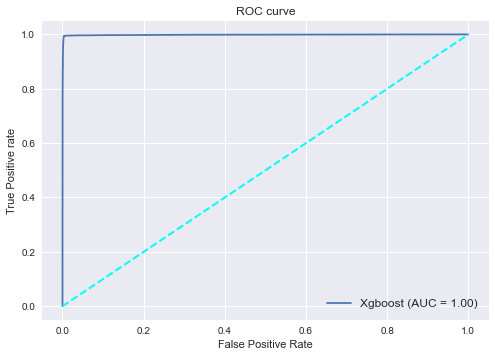

In [520]:
fpr, tpr, thresholds = roc_curve(y_test, y_probxg1[:,1])
au6=auc(fpr, tpr)
plt.plot(fpr,tpr, label='Xgboost (AUC = {0:0.2f})'.format(au6))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [521]:
asc=accuracy_score(y_test,y_pred_testxg1)
ps=precision_score(y_test,y_pred_testxg1)
rs=recall_score(y_test,y_pred_testxg1)
fs=f1_score(y_test,y_pred_testxg1)
roc6=roc_auc_score(y_test,y_probxg1[:,1])

In [522]:
update_metrics("Model_XGBOOST",asc,ps,rs,fs,au6,roc6,5)

In [523]:
from sklearn.ensemble import AdaBoostClassifier
ab= AdaBoostClassifier()
ab.fit(X_train, y_train)
y_pred_testab1= ab.predict(X_test)
y_pred_trainab1 = ab.predict(X_train)

In [524]:
y_probab1=ab.predict_proba(X_test)
y_probab1

array([[0.51973996, 0.48026004],
       [0.53662512, 0.46337488],
       [0.52267233, 0.47732767],
       ...,
       [0.52201609, 0.47798391],
       [0.49160448, 0.50839552],
       [0.52506485, 0.47493515]])

In [525]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testab1))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_trainab1))

Test Confusion  Matrix :  
 [[46052    89]
 [ 1066  9757]]


Train Confusion  Matrix :  
 [[107563    211]
 [  2447  22695]]


In [526]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testab1))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_trainab1))

Test Classification Report :  
               precision    recall  f1-score   support

           0       0.98      1.00      0.99     46141
           1       0.99      0.90      0.94     10823

    accuracy                           0.98     56964
   macro avg       0.98      0.95      0.97     56964
weighted avg       0.98      0.98      0.98     56964

Train Classification Report :  
               precision    recall  f1-score   support

           0       0.98      1.00      0.99    107774
           1       0.99      0.90      0.94     25142

    accuracy                           0.98    132916
   macro avg       0.98      0.95      0.97    132916
weighted avg       0.98      0.98      0.98    132916



In [527]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_trainab1),end="    ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testab1))
print('Train Precision : ', precision_score(y_train,y_pred_trainab1),end="   ")
print('Test Precision : ', precision_score(y_test,y_pred_testab1))
print('Train Recall : ', recall_score(y_train,y_pred_trainab1),end="      ")
print('Test Recall : ', recall_score(y_test,y_pred_testab1))

Train Accuracy :  0.9800024075355864    Test Accuracy :  0.9797240362334105
Train Precision :  0.9907884397101197   Test Precision :  0.9909607962624416
Train Recall :  0.9026728183915361      Test Recall :  0.901506051926453


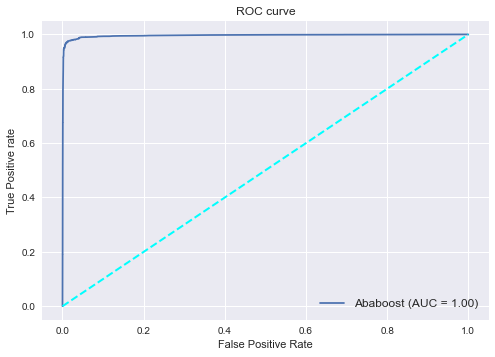

In [528]:
fpr, tpr, thresholds = roc_curve(y_test, y_probab1[:,1])
au7=auc(fpr, tpr)
plt.plot(fpr,tpr, label='Ababoost (AUC = {0:0.2f})'.format(au7))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [529]:
asc=accuracy_score(y_test,y_pred_testab1)
ps=precision_score(y_test,y_pred_testab1)
rs=recall_score(y_test,y_pred_testab1)
fs=f1_score(y_test,y_pred_testab1)
roc7=roc_auc_score(y_test,y_probab1[:,1])

In [530]:
update_metrics("Model_AdaBOOST",asc,ps,rs,fs,au7,roc7,6)

In [531]:
df_metrics

,model,Accuracy,Precision,Recall,F1 score,AUC,Roc_auc_score
0,Model_logistic,0.990994,0.988348,0.963966,0.976004,0.996907,0.996907
1,Model_Desicion-Tree,0.991433,0.978162,0.976716,0.977439,0.985567,0.987245
2,Model_Navie_Bayes,0.852609,0.651253,0.482768,0.554494,0.869785,0.869785
3,Model_Random_Forest,0.981322,0.989860,0.911023,0.948807,0.996569,0.996569
4,Model_KNN,0.849414,0.732642,0.326619,0.451815,0.785647,0.785647
5,Model_XGBOOST,0.995418,0.988529,0.987342,0.987935,0.998564,0.998564
6,Model_AdaBOOST,0.979724,0.990961,0.901506,0.944119,0.996049,0.996049


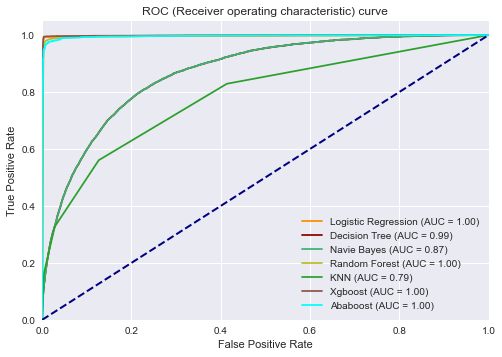

In [532]:
fpr1, tpr1, thresholds1 = roc_curve(y_test, y_problr1[:,1])
fpr2, tpr2, thresholds2 = roc_curve(y_test, y_probnb1[:,1])
fpr3, tpr3, thresholds3 = roc_curve(y_test, y_probnb1[:,1])
fpr4, tpr4, thresholds4 = roc_curve(y_test, y_probrf1[:,1])
fpr5, tpr5, thresholds5 = roc_curve(y_test, y_probkn1[:,1])
fpr6, tpr6, thresholds6 = roc_curve(y_test, y_probxg1[:,1])
fpr7, tpr7, thresholds7 = roc_curve(y_test, y_probab1[:,1])

plt.figure()
plt.plot(fpr1, tpr1, color='darkorange', label='Logistic Regression (AUC = {0:0.2f})'.format(au1))
plt.plot(fpr2, tpr2, color='darkred', label='Decision Tree (AUC = {0:0.2f})'.format(au2))
plt.plot(fpr3, tpr3, color='mediumseagreen', label='Navie Bayes (AUC = {0:0.2f})'.format(au3))
plt.plot(fpr4, tpr4, color='tab:olive', label='Random Forest (AUC = {0:0.2f})'.format(au4))
plt.plot(fpr5, tpr5, color='tab:green', label='KNN (AUC = {0:0.2f})'.format(au5))
plt.plot(fpr6, tpr6, color='tab:brown', label='Xgboost (AUC = {0:0.2f})'.format(au6))
plt.plot(fpr7, tpr7, color='cyan', label='Ababoost (AUC = {0:0.2f})'.format(au7))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC (Receiver operating characteristic) curve')
plt.legend(loc="lower right")
plt.show()

In [97]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

In [98]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier

In [99]:
models = []

models.append(('LR', LogisticRegression()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('XGB', XGBClassifier(eval_metric='logloss')))
models.append(('RF', RandomForestClassifier()))
models.append(('ADA', AdaBoostClassifier()))
models.append(('NB', GaussianNB()))
#testing models

results = []
names = []

for name, model in models:
    kfold = KFold(n_splits=10, random_state=42,shuffle=True)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='f1')
    results.append(cv_results)
    names.append(name)
    msg = '%s: %f (%f)' % (name, cv_results.mean(), cv_results.std())
    print(msg)

LR: 0.974265 (0.002248)
KNN: 0.951039 (0.002463)
CART: 0.976951 (0.001996)
XGB: 0.987449 (0.001868)
RF: 0.946378 (0.003576)
ADA: 0.943639 (0.004485)
NB: 0.556844 (0.005113)


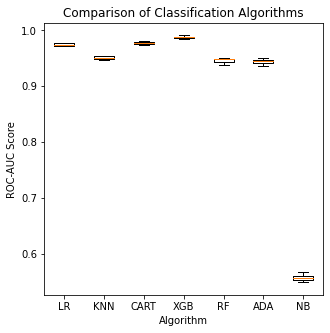

In [100]:
fig = plt.figure(figsize=(5,5))
plt.title('Comparison of Classification Algorithms')
plt.xlabel('Algorithm')
plt.ylabel('ROC-AUC Score')
plt.boxplot(results)
ax = fig.add_subplot(111)
ax.set_xticklabels(names)
plt.show()

In [101]:
log_reg_score = cross_val_score(LogisticRegression(), X_train, y_train, cv=10)
print('Logistic Regression Cross Validation Score: ', round(log_reg_score.mean() * 100, 2).astype(str) + '%')


knears_score = cross_val_score(KNeighborsClassifier(), X_train, y_train, cv=10)
print('Knears Neighbors Cross Validation Score', round(knears_score.mean() * 100, 2).astype(str) + '%')

xg_score = cross_val_score(XGBClassifier(eval_metric='logloss'), X_train, y_train, cv=10)
print('XG Boost Classifier Cross Validation Score', round(xg_score.mean() * 100, 2).astype(str) + '%')

tree_score = cross_val_score(DecisionTreeClassifier(), X_train, y_train, cv=10)
print('DecisionTree Classifier Cross Validation Score', round(tree_score.mean() * 100, 2).astype(str) + '%')

rf_score = cross_val_score(RandomForestClassifier(), X_train, y_train, cv=10)
print('Random Forest Classifier Cross Validation Score', round(rf_score.mean() * 100, 2).astype(str) + '%')

ada_score = cross_val_score(AdaBoostClassifier(), X_train, y_train, cv=10)
print('Ada Boost Classifier Cross Validation Score', round(ada_score.mean() * 100, 2).astype(str) + '%')

nb_score = cross_val_score(GaussianNB(), X_train, y_train, cv=10)
print('Navie Bayes Classifier Cross Validation Score', round(nb_score.mean() * 100, 2).astype(str) + '%')


Logistic Regression Cross Validation Score:  99.04%
Knears Neighbors Cross Validation Score 98.25%
XG Boost Classifier Cross Validation Score 99.53%
DecisionTree Classifier Cross Validation Score 99.16%
Random Forest Classifier Cross Validation Score 98.04%
Ada Boost Classifier Cross Validation Score 97.94%
Navie Bayes Classifier Cross Validation Score 85.41%


In [3]:
from sklearn.feature_selection import RFECV

In [4]:
from sklearn.tree import DecisionTreeClassifier
Dt= DecisionTreeClassifier()

In [10]:
rfecv=RFECV(Dt,cv=10,scoring='f1',n_jobs=-1)

In [11]:
rfecv.fit(X_train,y_train)

RFECV(cv=10, estimator=DecisionTreeClassifier(), n_jobs=-1, scoring='f1')

In [12]:
best_features=list(X_train.columns[rfecv.support_])

In [13]:
best_features

['loan_amnt', 'installment', 'total_pymnt', 'total_rec_int']

Votting

In [79]:
from sklearn.ensemble import VotingClassifier

In [80]:
rf=RandomForestClassifier()
Dt= DecisionTreeClassifier()
xg = XGBClassifier(eval_metric='logloss')

In [81]:
vot_clf = VotingClassifier(estimators = [('DT', Dt), ('RF', rf), ('XG', xg)], voting = 'hard')
vot_clf.fit(X_train, y_train)

VotingClassifier(estimators=[('DT', DecisionTreeClassifier()),
                             ('RF', RandomForestClassifier()),
                             ('XG',
                              XGBClassifier(base_score=None, booster=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None,
                                            eval_metric='logloss', gamma=None,
                                            gpu_id=None, importance_type='gain',
                                            interaction_constraints=None,
                                            learning_rate=None,
                                            max_delta_step=None, max_depth=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                               

In [82]:
pred = vot_clf.predict(X_test)

In [83]:
f1_score(y_test,pred)

0.9855824950164573

In [84]:
vot_clf.score(X_test,y_test)

0.9945404114879574

In [85]:
vot_clf.score(X_train,y_train)

1.0

In [92]:
accuracy_score(y_test,pred)

0.9945404114879574

In [302]:
for model in (Dt,rf,xg,vot_clf):
    model.fit(X_train,y_train)
    prediction=model.predict(X_test)
    print(model.__class__.__name__,f1_score(y_test,prediction))

DecisionTreeClassifier 0.9776668053821611
RandomForestClassifier 0.9487512631730908
XGBClassifier 0.9879350991540702
VotingClassifier 0.985632183908046


In [533]:
X2=df1[['loan_amnt', 'installment', 'total_pymnt', 'total_rec_int']]

In [534]:
from sklearn.model_selection import train_test_split 
X_train,X_test,y_train,y_test=train_test_split(X2,y ,test_size=.3,random_state=42)

In [535]:
df_metrics1=pd.DataFrame(columns=['With_Best_Featuresmodel','Accuracy','Precision','Recall','F1 score','AUC','Roc_auc_score'])
def update_metrics(m,acc,prec,rec,f1,auc,roc,i):
    df_metrics1.loc[i]=(m,acc,prec,rec,f1,auc,roc)

In [536]:
###Logistic with sklearn
from sklearn.linear_model import LogisticRegression 
Lr=LogisticRegression()
Lr.fit(X_train, y_train)
y_pred_testlr2 =Lr.predict(X_test)
y_pred_trainlr2 =Lr.predict(X_train)

In [537]:
y_problr2=Lr.predict_proba(X_test)
y_problr2

array([[9.72269604e-01, 2.77303958e-02],
       [9.99983434e-01, 1.65662494e-05],
       [9.91539522e-01, 8.46047845e-03],
       ...,
       [9.97536369e-01, 2.46363130e-03],
       [1.24197689e-03, 9.98758023e-01],
       [9.72551999e-01, 2.74480005e-02]])

In [541]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testlr2))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_trainlr2))

Test Confusion  Matrix :  
 [[46016   125]
 [  391 10432]]


Train Confusion  Matrix :  
 [[107487    287]
 [   989  24153]]


In [542]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testlr2))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_trainlr2))

Test Classification Report :  
               precision    recall  f1-score   support

           0       0.99      1.00      0.99     46141
           1       0.99      0.96      0.98     10823

    accuracy                           0.99     56964
   macro avg       0.99      0.98      0.99     56964
weighted avg       0.99      0.99      0.99     56964

Train Classification Report :  
               precision    recall  f1-score   support

           0       0.99      1.00      0.99    107774
           1       0.99      0.96      0.97     25142

    accuracy                           0.99    132916
   macro avg       0.99      0.98      0.98    132916
weighted avg       0.99      0.99      0.99    132916



In [544]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_trainlr2),end="      ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testlr2))
print('Train Precision : ', precision_score(y_train,y_pred_trainlr2),end="     ")
print('Test Precision : ', precision_score(y_test,y_pred_testlr2))
print('Train Recall : ', recall_score(y_train,y_pred_trainlr2),end="        ")
print('Test Recall : ', recall_score(y_test,y_pred_testlr2))

Train Accuracy :  0.9903999518492883      Test Accuracy :  0.990941647356225
Train Precision :  0.9882569558101473     Test Precision :  0.988159515013735
Train Recall :  0.9606634317078991        Test Recall :  0.9638732329298716


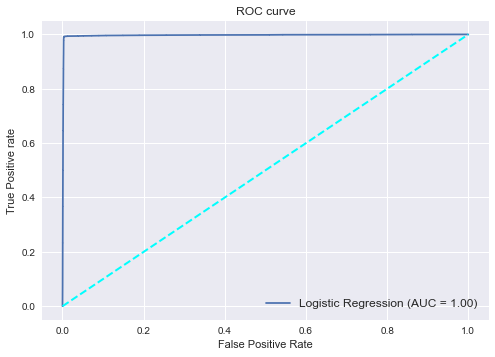

In [549]:
fpr, tpr, thresholds = roc_curve(y_test, y_problr2[:,1])
au1=auc(fpr, tpr)
plt.plot(fpr,tpr,label='Logistic Regression (AUC = {0:0.2f})'.format(au1))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [551]:
asc=accuracy_score(y_test,y_pred_testlr2)
ps=precision_score(y_test,y_pred_testlr2)
rs=recall_score(y_test,y_pred_testlr2)
fs=f1_score(y_test,y_pred_testlr2)
roc1=roc_auc_score(y_test,y_problr2[:,1])

In [552]:
update_metrics("Model_logistic",asc,ps,rs,fs,au1,roc1,0)

In [553]:
###Decesion Tree
from sklearn.tree import DecisionTreeClassifier
Dt= DecisionTreeClassifier()
Dt.fit(X_train,y_train)
y_pred_testdt2 = Dt.predict(X_test)
y_pred_traindt2 =Dt.predict(X_train)

In [554]:
y_probdt2=Dt.predict_proba(X_test)
y_probdt2

array([[1., 0.],
       [1., 0.],
       [1., 0.],
       ...,
       [1., 0.],
       [0., 1.],
       [1., 0.]])

In [555]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testdt2))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_traindt2))

Test Confusion  Matrix :  
 [[45949   192]
 [  224 10599]]


Train Confusion  Matrix :  
 [[107774      0]
 [     5  25137]]


In [556]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testdt2))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_traindt2))

Test Classification Report :  
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     46141
           1       0.98      0.98      0.98     10823

    accuracy                           0.99     56964
   macro avg       0.99      0.99      0.99     56964
weighted avg       0.99      0.99      0.99     56964

Train Classification Report :  
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    107774
           1       1.00      1.00      1.00     25142

    accuracy                           1.00    132916
   macro avg       1.00      1.00      1.00    132916
weighted avg       1.00      1.00      1.00    132916



In [575]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_traindt2),end="             ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testdt2))
print('Train Precision : ', precision_score(y_train,y_pred_traindt2),end="                           ")
print('Test Precision : ', precision_score(y_test,y_pred_testdt2))
print('Train Recall : ', recall_score(y_train,y_pred_traindt2),end="                ")
print('Test Recall : ', recall_score(y_test,y_pred_testdt2))

Train Accuracy :  0.9999623822564627             Test Accuracy :  0.992697142054631
Train Precision :  1.0                           Test Precision :  0.9822073950514317
Train Recall :  0.999801129583963                Test Recall :  0.9793033354892359


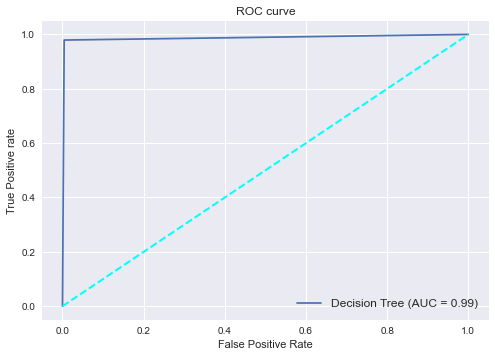

In [576]:
fpr, tpr, thresholds = roc_curve(y_test, y_probdt2[:,1])
au2=auc(fpr, tpr)
plt.plot(fpr,tpr, label='Decision Tree (AUC = {0:0.2f})'.format(au2))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [577]:
asc=accuracy_score(y_test,y_pred_testdt2)
ps=precision_score(y_test,y_pred_testdt2)
rs=recall_score(y_test,y_pred_testdt2)
fs=f1_score(y_test,y_pred_testdt2)
roc2=roc_auc_score(y_test,y_probdt2[:,1])

In [578]:
update_metrics("Model_Desicion-Tree",asc,ps,rs,fs,au2,roc2,1)

In [581]:
###Navie Bayes
from sklearn.naive_bayes import GaussianNB
nb=GaussianNB()
nb.fit(X_train,y_train)
y_pred_testnb2 = nb.predict(X_test)
y_pred_trainnb2 = nb.predict(X_train)

In [582]:
y_probnb2=nb.predict_proba(X_test)
y_probnb2

array([[0.65363107, 0.34636893],
       [0.99759499, 0.00240501],
       [0.96226989, 0.03773011],
       ...,
       [0.96961329, 0.03038671],
       [0.72723292, 0.27276708],
       [0.65381853, 0.34618147]])

In [583]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testnb2))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_trainnb2))

Test Confusion  Matrix :  
 [[46130    11]
 [10090   733]]


Train Confusion  Matrix :  
 [[107753     21]
 [ 23472   1670]]


In [584]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testnb2))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_trainnb2))

Test Classification Report :  
               precision    recall  f1-score   support

           0       0.82      1.00      0.90     46141
           1       0.99      0.07      0.13     10823

    accuracy                           0.82     56964
   macro avg       0.90      0.53      0.51     56964
weighted avg       0.85      0.82      0.75     56964

Train Classification Report :  
               precision    recall  f1-score   support

           0       0.82      1.00      0.90    107774
           1       0.99      0.07      0.12     25142

    accuracy                           0.82    132916
   macro avg       0.90      0.53      0.51    132916
weighted avg       0.85      0.82      0.75    132916



In [588]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_trainnb2),end="            ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testnb2))
print('Train Precision : ', precision_score(y_train,y_pred_trainnb2),end="           ")
print('Test Precision : ', precision_score(y_test,y_pred_testnb2))
print('Train Recall : ', recall_score(y_train,y_pred_trainnb2),end="             ")
print('Test Recall : ', recall_score(y_test,y_pred_testnb2))

Train Accuracy :  0.8232492702157754            Test Accuracy :  0.8226774805140088
Train Precision :  0.9875813128326434           Test Precision :  0.9852150537634409
Train Recall :  0.06642271895632805             Test Recall :  0.0677261387785272


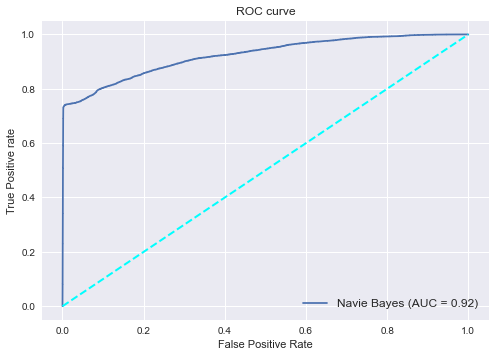

In [590]:
fpr, tpr, thresholds = roc_curve(y_test, y_probnb2[:,1])
au3=auc(fpr, tpr)
plt.plot(fpr,tpr, label='Navie Bayes (AUC = {0:0.2f})'.format(au3))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [591]:
asc=accuracy_score(y_test,y_pred_testnb2)
ps=precision_score(y_test,y_pred_testnb2)
rs=recall_score(y_test,y_pred_testnb2)
fs=f1_score(y_test,y_pred_testnb2)
roc3=roc_auc_score(y_test,y_probnb2[:,1])

In [592]:
update_metrics("Model_Navie_Bayes",asc,ps,rs,fs,au3,roc3,2)

In [593]:
###Random Forest
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier()
rf.fit(X_train, y_train)
y_pred_testrf2= rf.predict(X_test)
y_pred_trainrf2 = rf.predict(X_train)

In [594]:
y_probrf2=rf.predict_proba(X_test)
y_probrf2

array([[1.  , 0.  ],
       [1.  , 0.  ],
       [0.99, 0.01],
       ...,
       [0.99, 0.01],
       [0.  , 1.  ],
       [1.  , 0.  ]])

In [595]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testrf2))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_trainrf2))

Test Confusion  Matrix :  
 [[46001   140]
 [   92 10731]]


Train Confusion  Matrix :  
 [[107773      1]
 [     4  25138]]


In [596]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testrf2))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_trainrf2))

Test Classification Report :  
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     46141
           1       0.99      0.99      0.99     10823

    accuracy                           1.00     56964
   macro avg       0.99      0.99      0.99     56964
weighted avg       1.00      1.00      1.00     56964

Train Classification Report :  
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    107774
           1       1.00      1.00      1.00     25142

    accuracy                           1.00    132916
   macro avg       1.00      1.00      1.00    132916
weighted avg       1.00      1.00      1.00    132916



In [597]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_trainrf2),end="    ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testrf2))
print('Train Precision : ', precision_score(y_train,y_pred_trainrf2),end="   ")
print('Test Precision : ', precision_score(y_test,y_pred_testrf2))
print('Train Recall : ', recall_score(y_train,y_pred_trainrf2),end="      ")
print('Test Recall : ', recall_score(y_test,y_pred_testrf2))

Train Accuracy :  0.9999623822564627    Test Accuracy :  0.995927252299698
Train Precision :  0.9999602211702932   Test Precision :  0.9871216999356085
Train Recall :  0.9998409036671705      Test Recall :  0.9914995842187934


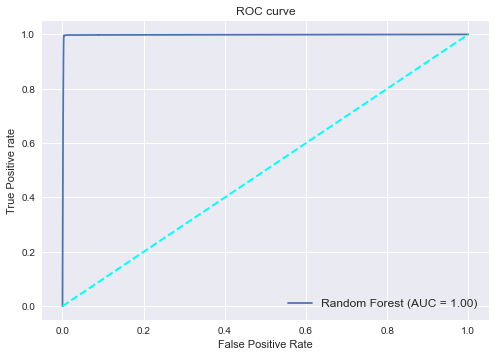

In [599]:
fpr, tpr, thresholds = roc_curve(y_test, y_probrf2[:,1])
au4=auc(fpr, tpr)
plt.plot(fpr,tpr, label='Random Forest (AUC = {0:0.2f})'.format(au4))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [600]:
asc=accuracy_score(y_test,y_pred_testrf2)
ps=precision_score(y_test,y_pred_testrf2)
rs=recall_score(y_test,y_pred_testrf2)
fs=f1_score(y_test,y_pred_testrf2)
roc4=roc_auc_score(y_test,y_probrf2[:,1])

In [601]:
update_metrics("Model_Random_Forest",asc,ps,rs,fs,au4,roc4,3)

In [615]:
###Xgboost
from xgboost import XGBClassifier
xg = XGBClassifier(eval_metric='logloss')
xg.fit(X_train, y_train)
y_pred_testxg2 = xg.predict(X_test)
y_pred_trainxg2 = xg.predict(X_train)

In [616]:
y_probxg2=xg.predict_proba(X_test)
y_probxg2

array([[9.9934477e-01, 6.5525499e-04],
       [9.9911946e-01, 8.8053657e-04],
       [9.9032062e-01, 9.6793994e-03],
       ...,
       [9.9651319e-01, 3.4868272e-03],
       [1.5088320e-03, 9.9849117e-01],
       [9.9854684e-01, 1.4531416e-03]], dtype=float32)

In [617]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testxg2))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_trainxg2))

Test Confusion  Matrix :  
 [[46001   140]
 [  128 10695]]


Train Confusion  Matrix :  
 [[107494    280]
 [   169  24973]]


In [618]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testxg2))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_trainxg2))

Test Classification Report :  
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     46141
           1       0.99      0.99      0.99     10823

    accuracy                           1.00     56964
   macro avg       0.99      0.99      0.99     56964
weighted avg       1.00      1.00      1.00     56964

Train Classification Report :  
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    107774
           1       0.99      0.99      0.99     25142

    accuracy                           1.00    132916
   macro avg       0.99      1.00      0.99    132916
weighted avg       1.00      1.00      1.00    132916



In [620]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_trainxg2),end="      ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testxg2))
print('Train Precision : ', precision_score(y_train,y_pred_trainxg2),end="    ")
print('Test Precision : ', precision_score(y_test,y_pred_testxg2))
print('Train Recall : ', recall_score(y_train,y_pred_trainxg2),end="       ")
print('Test Recall : ', recall_score(y_test,y_pred_testxg2))

Train Accuracy :  0.996621926630353      Test Accuracy :  0.9952952742082719
Train Precision :  0.9889122084504811    Test Precision :  0.9870789109367789
Train Recall :  0.9932781799379524       Test Recall :  0.9881733345652777


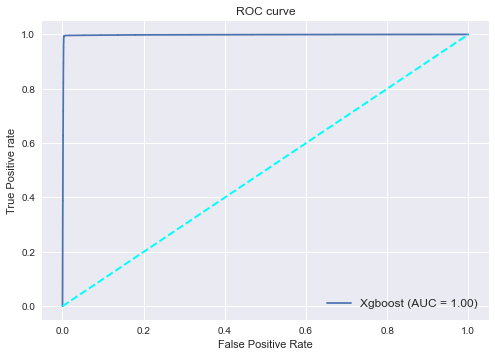

In [622]:
fpr, tpr, thresholds = roc_curve(y_test, y_probxg2[:,1])
au5=auc(fpr, tpr)
plt.plot(fpr,tpr, label='Xgboost (AUC = {0:0.2f})'.format(au5))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [623]:
asc=accuracy_score(y_test,y_pred_testxg2)
ps=precision_score(y_test,y_pred_testxg2)
rs=recall_score(y_test,y_pred_testxg2)
fs=f1_score(y_test,y_pred_testxg2)
roc5=roc_auc_score(y_test,y_probxg2[:,1])

In [624]:
update_metrics("Model_XGBOOST",asc,ps,rs,fs,au5,roc5,4)

In [625]:
from sklearn.ensemble import AdaBoostClassifier
ab= AdaBoostClassifier()
ab.fit(X_train, y_train)
y_pred_testab2= ab.predict(X_test)
y_pred_trainab2 = ab.predict(X_train)

In [626]:
y_probab2=ab.predict_proba(X_test)
y_probab2

array([[0.51663548, 0.48336452],
       [0.53975772, 0.46024228],
       [0.5155365 , 0.4844635 ],
       ...,
       [0.52195333, 0.47804667],
       [0.49568498, 0.50431502],
       [0.51663548, 0.48336452]])

In [627]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testab2))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_trainab2))

Test Confusion  Matrix :  
 [[46039   102]
 [ 1284  9539]]


Train Confusion  Matrix :  
 [[107545    229]
 [  3003  22139]]


In [628]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testab2))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_trainab2))

Test Classification Report :  
               precision    recall  f1-score   support

           0       0.97      1.00      0.99     46141
           1       0.99      0.88      0.93     10823

    accuracy                           0.98     56964
   macro avg       0.98      0.94      0.96     56964
weighted avg       0.98      0.98      0.98     56964

Train Classification Report :  
               precision    recall  f1-score   support

           0       0.97      1.00      0.99    107774
           1       0.99      0.88      0.93     25142

    accuracy                           0.98    132916
   macro avg       0.98      0.94      0.96    132916
weighted avg       0.98      0.98      0.98    132916



In [629]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_trainab2),end="    ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testab2))
print('Train Precision : ', precision_score(y_train,y_pred_trainab2),end="   ")
print('Test Precision : ', precision_score(y_test,y_pred_testab2))
print('Train Recall : ', recall_score(y_train,y_pred_trainab2),end="      ")
print('Test Recall : ', recall_score(y_test,y_pred_testab2))

Train Accuracy :  0.9756838905775076    Test Accuracy :  0.9756688434800926
Train Precision :  0.9897621602288984   Test Precision :  0.9894201846281506
Train Recall :  0.8805584281282316      Test Recall :  0.8813637623579414


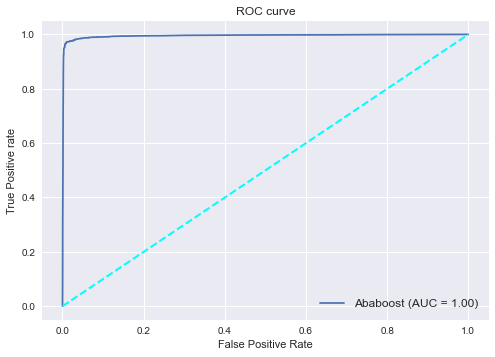

In [630]:
fpr, tpr, thresholds = roc_curve(y_test, y_probab2[:,1])
au6=auc(fpr, tpr)
plt.plot(fpr,tpr, label='Ababoost (AUC = {0:0.2f})'.format(au6))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [632]:
asc=accuracy_score(y_test,y_pred_testab2)
ps=precision_score(y_test,y_pred_testab2)
rs=recall_score(y_test,y_pred_testab2)
fs=f1_score(y_test,y_pred_testab2)
roc6=roc_auc_score(y_test,y_probab2[:,1])

In [633]:
update_metrics("Model_AdaBOOST",asc,ps,rs,fs,au6,roc6,5)

In [634]:
df_metrics1

,With_Best_Featuresmodel,Accuracy,Precision,Recall,F1 score,AUC,Roc_auc_score
0,Model_logistic,0.990942,0.988160,0.963873,0.975865,0.996861,0.996861
1,Model_Desicion-Tree,0.992697,0.982207,0.979303,0.980753,0.987542,0.987542
2,Model_Navie_Bayes,0.822677,0.985215,0.067726,0.126740,0.923509,0.923509
3,Model_Random_Forest,0.995927,0.987122,0.991500,0.989306,0.997762,0.997762
4,Model_XGBOOST,0.995295,0.987079,0.988173,0.987626,0.997743,0.997743
5,Model_AdaBOOST,0.975669,0.989420,0.881364,0.932271,0.995041,0.995041


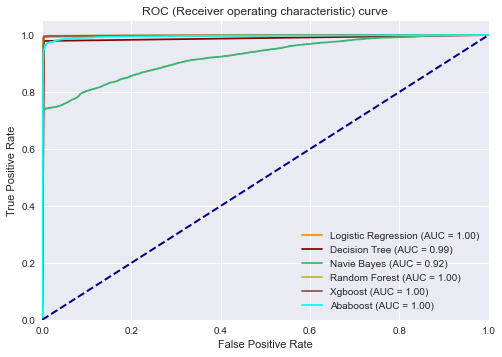

In [635]:
fpr1, tpr1, thresholds1 = roc_curve(y_test, y_problr2[:,1])
fpr2, tpr2, thresholds2 = roc_curve(y_test, y_probdt2[:,1])
fpr3, tpr3, thresholds3 = roc_curve(y_test, y_probnb2[:,1])
fpr4, tpr4, thresholds4 = roc_curve(y_test, y_probrf2[:,1])
fpr5, tpr5, thresholds6 = roc_curve(y_test, y_probxg2[:,1])
fpr6, tpr6, thresholds7 = roc_curve(y_test, y_probab2[:,1])

plt.figure()
plt.plot(fpr1, tpr1, color='darkorange', label='Logistic Regression (AUC = {0:0.2f})'.format(au1))
plt.plot(fpr2, tpr2, color='darkred', label='Decision Tree (AUC = {0:0.2f})'.format(au2))
plt.plot(fpr3, tpr3, color='mediumseagreen', label='Navie Bayes (AUC = {0:0.2f})'.format(au3))
plt.plot(fpr4, tpr4, color='tab:olive', label='Random Forest (AUC = {0:0.2f})'.format(au4))
plt.plot(fpr5, tpr5, color='tab:brown', label='Xgboost (AUC = {0:0.2f})'.format(au5))
plt.plot(fpr6, tpr6, color='cyan', label='Ababoost (AUC = {0:0.2f})'.format(au6))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC (Receiver operating characteristic) curve')
plt.legend(loc="lower right")
plt.show()

In [297]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

In [298]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier

In [299]:
models = []

models.append(('LR', LogisticRegression()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('XGB', XGBClassifier(eval_metric='logloss')))
models.append(('RF', RandomForestClassifier()))
models.append(('ADA', AdaBoostClassifier()))
models.append(('NB', GaussianNB()))
#testing models

results = []
names = []

for name, model in models:
    kfold = KFold(n_splits=10, random_state=42,shuffle=True)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='f1')
    results.append(cv_results)
    names.append(name)
    msg = '%s: %f (%f)' % (name, cv_results.mean(), cv_results.std())
    print(msg)

LR: 0.974307 (0.002382)
KNN: 0.990745 (0.000900)
CART: 0.980769 (0.002252)
XGB: 0.987970 (0.001440)
RF: 0.988974 (0.001218)
ADA: 0.929578 (0.003902)
NB: 0.123935 (0.007065)


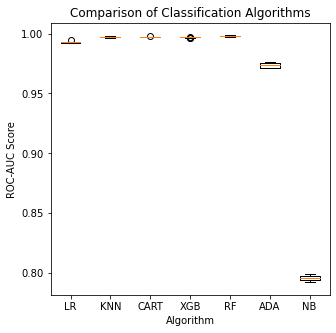

In [231]:
fig = plt.figure(figsize=(5,5))
plt.title('Comparison of Classification Algorithms')
plt.xlabel('Algorithm')
plt.ylabel('ROC-AUC Score')
plt.boxplot(results)
ax = fig.add_subplot(111)
ax.set_xticklabels(names)
plt.show()

In [ ]:
log_reg_score = cross_val_score(LogisticRegression(), X_train, y_train, cv=10)
print('Logistic Regression Cross Validation Score: ', round(log_reg_score.mean() * 100, 2).astype(str) + '%')


knears_score = cross_val_score(KNeighborsClassifier(), X_train, y_train, cv=10)
print('Knears Neighbors Cross Validation Score', round(knears_score.mean() * 100, 2).astype(str) + '%')

xg_score = cross_val_score(XGBClassifier(eval_metric='logloss'), X_train, y_train, cv=10)
print('XG Boost Classifier Cross Validation Score', round(xg_score.mean() * 100, 2).astype(str) + '%')

tree_score = cross_val_score(DecisionTreeClassifier(), X_train, y_train, cv=10)
print('DecisionTree Classifier Cross Validation Score', round(tree_score.mean() * 100, 2).astype(str) + '%')

rf_score = cross_val_score(RandomForestClassifier(), X_train, y_train, cv=10)
print('Random Forest Classifier Cross Validation Score', round(rf_score.mean() * 100, 2).astype(str) + '%')

ada_score = cross_val_score(AdaBoostClassifier(), X_train, y_train, cv=10)
print('Ada Boost Classifier Cross Validation Score', round(ada_score.mean() * 100, 2).astype(str) + '%')

nb_score = cross_val_score(GaussianNB(), X_train, y_train, cv=10)
print('Navie Bayes Classifier Cross Validation Score', round(nb_score.mean() * 100, 2).astype(str) + '%')


---------------------------------------------------------------------------

In [822]:
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter
# instantiating over and under sampler
over = RandomOverSampler()
under = RandomUnderSampler()
# first performing oversampling to minority class
X1, y1 = over.fit_resample(X, y)
print(f"Oversampled: {Counter(y1)}")
# now to comine under sampling 
X2, y2 = under.fit_resample(X1, y1)
print(f"Combined Random Sampling: {Counter(y2)}")

Oversampled: Counter({0: 153915, 1: 153915})
Combined Random Sampling: Counter({0: 153915, 1: 153915})


In [823]:
from sklearn.model_selection import train_test_split 
X_train,X_test,y_train,y_test=train_test_split(X2,y2,test_size=.3,random_state=42)

In [638]:
df_metrics2=pd.DataFrame(columns=['With SMOTE-model','Accuracy','Precision','Recall','F1 score','AUC','Roc_auc_score'])
def update_metrics(m,acc,prec,rec,f1,auc,roc,i):
    df_metrics2.loc[i]=(m,acc,prec,rec,f1,auc,roc)

In [639]:
###Logistic with sklearn
from sklearn.linear_model import LogisticRegression 
Lr=LogisticRegression()
Lr.fit(X_train, y_train)
y_pred_testlr3 =Lr.predict(X_test)
y_pred_trainlr3 =Lr.predict(X_train)

In [640]:
y_problr3=Lr.predict_proba(X_test)
y_problr3

array([[9.97467277e-01, 2.53272265e-03],
       [9.99463796e-01, 5.36203562e-04],
       [9.84679005e-12, 1.00000000e+00],
       ...,
       [4.95159469e-13, 1.00000000e+00],
       [4.35633444e-08, 9.99999956e-01],
       [3.78066327e-03, 9.96219337e-01]])

In [641]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testlr3))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_trainlr3))

Test Confusion  Matrix :  
 [[45999   136]
 [  567 45647]]


Train Confusion  Matrix :  
 [[107467    313]
 [  1336 106365]]


In [642]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testlr3))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_trainlr3))

Test Classification Report :  
               precision    recall  f1-score   support

           0       0.99      1.00      0.99     46135
           1       1.00      0.99      0.99     46214

    accuracy                           0.99     92349
   macro avg       0.99      0.99      0.99     92349
weighted avg       0.99      0.99      0.99     92349

Train Classification Report :  
               precision    recall  f1-score   support

           0       0.99      1.00      0.99    107780
           1       1.00      0.99      0.99    107701

    accuracy                           0.99    215481
   macro avg       0.99      0.99      0.99    215481
weighted avg       0.99      0.99      0.99    215481



In [644]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_trainlr3),end="      ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testlr3))
print('Train Precision : ', precision_score(y_train,y_pred_trainlr3),end="      ")
print('Test Precision : ', precision_score(y_test,y_pred_testlr3))
print('Train Recall : ', recall_score(y_train,y_pred_trainlr3),end="        ")
print('Test Recall : ', recall_score(y_test,y_pred_testlr3))

Train Accuracy :  0.9923473531309025      Test Accuracy :  0.9923875732276473
Train Precision :  0.997065936744221      Test Precision :  0.9970294650852937
Train Recall :  0.9875952869518388        Test Recall :  0.9877309906089063


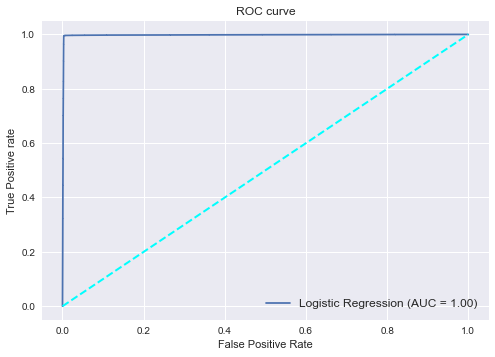

In [645]:
fpr, tpr, thresholds = roc_curve(y_test, y_problr3[:,1])
au1=auc(fpr, tpr)
plt.plot(fpr,tpr,label='Logistic Regression (AUC = {0:0.2f})'.format(au1))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [646]:
asc=accuracy_score(y_test,y_pred_testlr3)
ps=precision_score(y_test,y_pred_testlr3)
rs=recall_score(y_test,y_pred_testlr3)
fs=f1_score(y_test,y_pred_testlr3)
roc1=roc_auc_score(y_test,y_problr3[:,1])

In [647]:
update_metrics("Model_logistic",asc,ps,rs,fs,au1,roc1,0)

In [648]:
###Decesion Tree
from sklearn.tree import DecisionTreeClassifier
Dt= DecisionTreeClassifier()
Dt.fit(X_train,y_train)
y_pred_testdt3 = Dt.predict(X_test)
y_pred_traindt3 =Dt.predict(X_train)

In [649]:
y_probdt3=Dt.predict_proba(X_test)
y_probdt3

array([[1., 0.],
       [1., 0.],
       [0., 1.],
       ...,
       [0., 1.],
       [0., 1.],
       [0., 1.]])

In [650]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testdt3))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_traindt3))

Test Confusion  Matrix :  
 [[45879   256]
 [   49 46165]]


Train Confusion  Matrix :  
 [[107780      0]
 [     0 107701]]


In [651]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testdt3))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_traindt3))

Test Classification Report :  
               precision    recall  f1-score   support

           0       1.00      0.99      1.00     46135
           1       0.99      1.00      1.00     46214

    accuracy                           1.00     92349
   macro avg       1.00      1.00      1.00     92349
weighted avg       1.00      1.00      1.00     92349

Train Classification Report :  
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    107780
           1       1.00      1.00      1.00    107701

    accuracy                           1.00    215481
   macro avg       1.00      1.00      1.00    215481
weighted avg       1.00      1.00      1.00    215481



In [658]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_traindt3),end="              ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testdt3))
print('Train Precision : ', precision_score(y_train,y_pred_traindt3),end="             ")
print('Test Precision : ', precision_score(y_test,y_pred_testdt3))
print('Train Recall : ', recall_score(y_train,y_pred_traindt3),end="                ")
print('Test Recall : ', recall_score(y_test,y_pred_testdt3))

Train Accuracy :  1.0              Test Accuracy :  0.9966973112865326
Train Precision :  1.0             Test Precision :  0.9944852545184292
Train Recall :  1.0                Test Recall :  0.9989397152378068


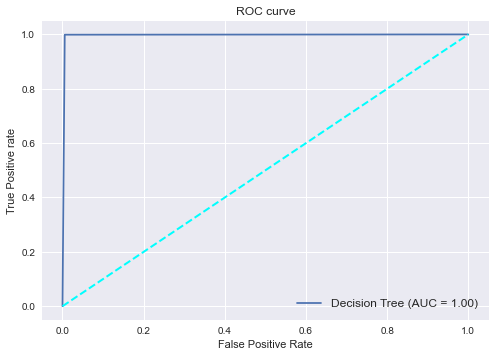

In [659]:
fpr, tpr, thresholds = roc_curve(y_test, y_probdt3[:,1])
au2=auc(fpr, tpr)
plt.plot(fpr,tpr, label='Decision Tree (AUC = {0:0.2f})'.format(au2))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [660]:
asc=accuracy_score(y_test,y_pred_testdt3)
ps=precision_score(y_test,y_pred_testdt3)
rs=recall_score(y_test,y_pred_testdt3)
fs=f1_score(y_test,y_pred_testdt3)
roc2=roc_auc_score(y_test,y_probdt3[:,1])

In [661]:
update_metrics("Model_Desicion-Tree",asc,ps,rs,fs,au2,roc2,1)

In [662]:
###Navie Bayes
from sklearn.naive_bayes import GaussianNB
nb=GaussianNB()
nb.fit(X_train,y_train)
y_pred_testnb3 = nb.predict(X_test)
y_pred_trainnb3 = nb.predict(X_train)

In [663]:
y_probnb3=nb.predict_proba(X_test)
y_probnb3

array([[0.98953878, 0.01046122],
       [0.99312366, 0.00687634],
       [0.11141844, 0.88858156],
       ...,
       [0.07593048, 0.92406952],
       [0.62675805, 0.37324195],
       [0.41775802, 0.58224198]])

In [664]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testnb3))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_trainnb3))

Test Confusion  Matrix :  
 [[34384 11751]
 [ 7866 38348]]


Train Confusion  Matrix :  
 [[80510 27270]
 [17965 89736]]


In [665]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testnb3))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_trainnb3))

Test Classification Report :  
               precision    recall  f1-score   support

           0       0.81      0.75      0.78     46135
           1       0.77      0.83      0.80     46214

    accuracy                           0.79     92349
   macro avg       0.79      0.79      0.79     92349
weighted avg       0.79      0.79      0.79     92349

Train Classification Report :  
               precision    recall  f1-score   support

           0       0.82      0.75      0.78    107780
           1       0.77      0.83      0.80    107701

    accuracy                           0.79    215481
   macro avg       0.79      0.79      0.79    215481
weighted avg       0.79      0.79      0.79    215481



In [668]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_trainnb3),end="            ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testnb3))
print('Train Precision : ', precision_score(y_train,y_pred_trainnb3),end="           ")
print('Test Precision : ', precision_score(y_test,y_pred_testnb3))
print('Train Recall : ', recall_score(y_train,y_pred_trainnb3),end="                ")
print('Test Recall : ', recall_score(y_test,y_pred_testnb3))

Train Accuracy :  0.7900742988941021            Test Accuracy :  0.7875775590423285
Train Precision :  0.7669350289728731           Test Precision :  0.7654444200483044
Train Recall :  0.83319560635463                Test Recall :  0.8297918379711776


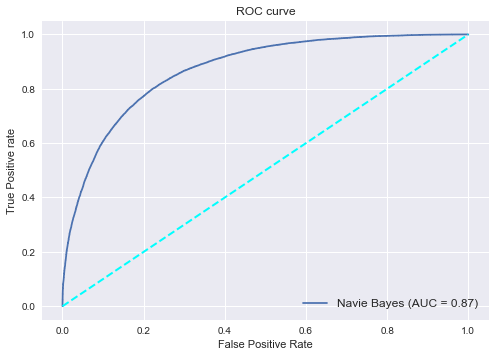

In [669]:
fpr, tpr, thresholds = roc_curve(y_test, y_probnb3[:,1])
au3=auc(fpr, tpr)
plt.plot(fpr,tpr, label='Navie Bayes (AUC = {0:0.2f})'.format(au3))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [670]:
asc=accuracy_score(y_test,y_pred_testnb3)
ps=precision_score(y_test,y_pred_testnb3)
rs=recall_score(y_test,y_pred_testnb3)
fs=f1_score(y_test,y_pred_testnb3)
roc3=roc_auc_score(y_test,y_probnb3[:,1])

In [671]:
update_metrics("Model_Navie_Bayes",asc,ps,rs,fs,au3,roc3,2)

In [825]:
###Random Forest
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier()
rf.fit(X_train, y_train)
y_pred_testrf3= rf.predict(X_test)
y_pred_trainrf3 = rf.predict(X_train)

In [826]:
y_probrf3=rf.predict_proba(X_test)
y_probrf3

array([[0.91, 0.09],
       [0.83, 0.17],
       [0.02, 0.98],
       ...,
       [0.  , 1.  ],
       [0.  , 1.  ],
       [0.  , 1.  ]])

In [827]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testrf3))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_trainrf3))

Test Confusion  Matrix :  
 [[46019   116]
 [   99 46115]]


Train Confusion  Matrix :  
 [[107780      0]
 [     0 107701]]


In [828]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testrf3))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_trainrf3))

Test Classification Report :  
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     46135
           1       1.00      1.00      1.00     46214

    accuracy                           1.00     92349
   macro avg       1.00      1.00      1.00     92349
weighted avg       1.00      1.00      1.00     92349

Train Classification Report :  
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    107780
           1       1.00      1.00      1.00    107701

    accuracy                           1.00    215481
   macro avg       1.00      1.00      1.00    215481
weighted avg       1.00      1.00      1.00    215481



In [829]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_trainrf3),end="    ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testrf3))
print('Train Precision : ', precision_score(y_train,y_pred_trainrf3),end="   ")
print('Test Precision : ', precision_score(y_test,y_pred_testrf3))
print('Train Recall : ', recall_score(y_train,y_pred_trainrf3),end="      ")
print('Test Recall : ', recall_score(y_test,y_pred_testrf3))

Train Accuracy :  1.0    Test Accuracy :  0.9976718751691951
Train Precision :  1.0   Test Precision :  0.9974908611105102
Train Recall :  1.0      Test Recall :  0.9978577920110789


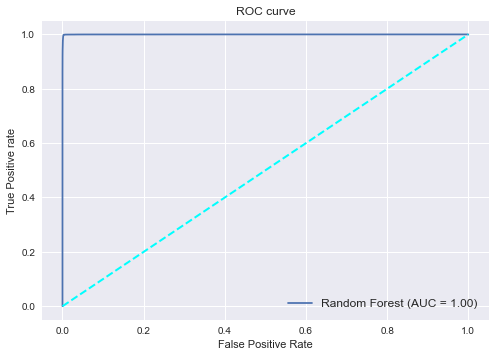

In [830]:
fpr, tpr, thresholds = roc_curve(y_test, y_probrf3[:,1])
au4=auc(fpr, tpr)
plt.plot(fpr,tpr, label='Random Forest (AUC = {0:0.2f})'.format(au4))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [678]:
asc=accuracy_score(y_test,y_pred_testrf3)
ps=precision_score(y_test,y_pred_testrf3)
rs=recall_score(y_test,y_pred_testrf3)
fs=f1_score(y_test,y_pred_testrf3)
roc4=roc_auc_score(y_test,y_probrf3[:,1])

In [679]:
update_metrics("Model_Random_Forest",asc,ps,rs,fs,au4,roc4,3)

In [833]:
from sklearn.metrics import f1_score
from rfpimp import permutation_importances

def f1(rf, X_train, y_train):
    return f1_score(y_train, rf.predict(X_train))

perm_imp_rfpimp = permutation_importances(rf, X_train, y_train, f1)

In [835]:
permutation_importances(rf, X_train, y_train, f1)

,Importance
Feature,
total_pymnt,0.426080
installment,0.022240
total_rec_int,0.017186
loan_amnt,0.015505
int_rate,0.005531
...,...
addr_state_IN,0.000000
addr_state_KS,0.000000
addr_state_KY,0.000000


In [845]:
sorted_indices = np.argsort(rf.feature_importances_)[::-1]

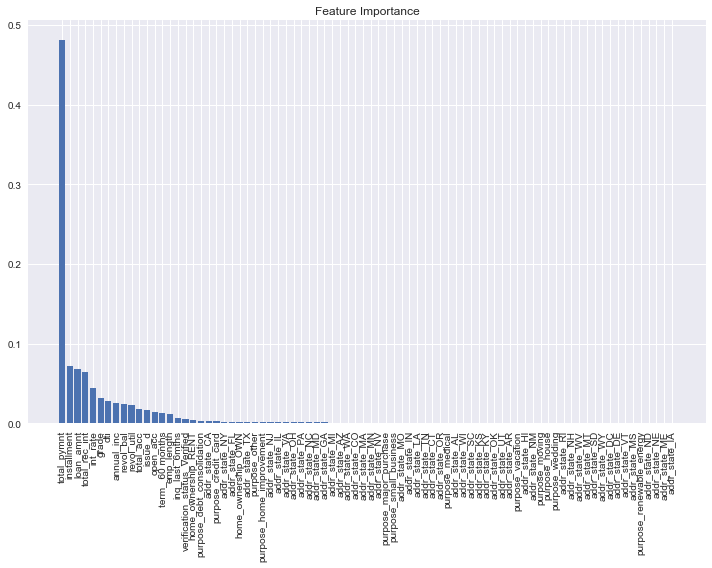

In [850]:
plt.figure(figsize=(10,8))
plt.title('Feature Importance')
plt.bar(range(X_train.shape[1]), rf.feature_importances_[sorted_indices], align='center')
plt.xticks(range(X_train.shape[1]), X_train.columns[sorted_indices], rotation=90)
plt.tight_layout()
plt.show()

In [680]:
###Xgboost
from xgboost import XGBClassifier
xg = XGBClassifier(eval_metric='logloss')
xg.fit(X_train, y_train)
y_pred_testxg3 = xg.predict(X_test)
y_pred_trainxg3 = xg.predict(X_train)

In [681]:
y_probxg3=xg.predict_proba(X_test)
y_probxg3

array([[9.9859792e-01, 1.4020624e-03],
       [9.9982893e-01, 1.7105699e-04],
       [4.8577785e-04, 9.9951422e-01],
       ...,
       [3.3748150e-04, 9.9966252e-01],
       [3.9229989e-03, 9.9607700e-01],
       [9.5421076e-04, 9.9904579e-01]], dtype=float32)

In [682]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testxg3))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_trainxg3))

Test Confusion  Matrix :  
 [[46005   130]
 [   62 46152]]


Train Confusion  Matrix :  
 [[107605    175]
 [    46 107655]]


In [683]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testxg3))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_trainxg3))

Test Classification Report :  
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     46135
           1       1.00      1.00      1.00     46214

    accuracy                           1.00     92349
   macro avg       1.00      1.00      1.00     92349
weighted avg       1.00      1.00      1.00     92349

Train Classification Report :  
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    107780
           1       1.00      1.00      1.00    107701

    accuracy                           1.00    215481
   macro avg       1.00      1.00      1.00    215481
weighted avg       1.00      1.00      1.00    215481



In [685]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_trainxg3),end="     ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testxg3))
print('Train Precision : ', precision_score(y_train,y_pred_trainxg3),end="    ")
print('Test Precision : ', precision_score(y_test,y_pred_testxg3))
print('Train Recall : ', recall_score(y_train,y_pred_trainxg3),end="       ")
print('Test Recall : ', recall_score(y_test,y_pred_testxg3))

Train Accuracy :  0.9989743875330076     Test Accuracy :  0.9979209303836533
Train Precision :  0.9983770750255031    Test Precision :  0.9971911326217536
Train Recall :  0.9995728916166052       Test Recall :  0.9986584151988575


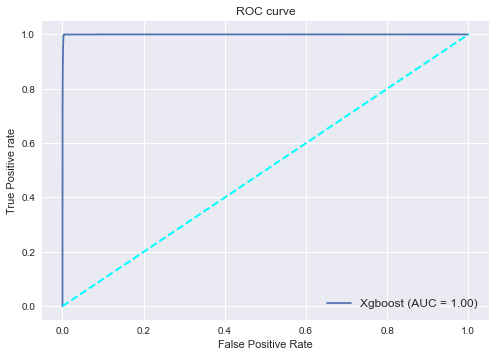

In [686]:
fpr, tpr, thresholds = roc_curve(y_test, y_probxg3[:,1])
au5=auc(fpr, tpr)
plt.plot(fpr,tpr, label='Xgboost (AUC = {0:0.2f})'.format(au5))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [688]:
asc=accuracy_score(y_test,y_pred_testxg3)
ps=precision_score(y_test,y_pred_testxg3)
rs=recall_score(y_test,y_pred_testxg3)
fs=f1_score(y_test,y_pred_testxg3)
roc5=roc_auc_score(y_test,y_probxg3[:,1])

In [689]:
update_metrics("Model_XGBOOST",asc,ps,rs,fs,au5,roc5,4)

In [690]:
from sklearn.ensemble import AdaBoostClassifier
ab= AdaBoostClassifier()
ab.fit(X_train, y_train)
y_pred_testab3= ab.predict(X_test)
y_pred_trainab3 = ab.predict(X_train)

In [691]:
y_probab3=ab.predict_proba(X_test)
y_probab3

array([[0.51302661, 0.48697339],
       [0.53175154, 0.46824846],
       [0.47854799, 0.52145201],
       ...,
       [0.46512448, 0.53487552],
       [0.48068766, 0.51931234],
       [0.48815153, 0.51184847]])

In [824]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testab3))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_trainab3))

Test Confusion  Matrix :  
 [[45877   258]
 [ 1632 44582]]


Train Confusion  Matrix :  
 [[107185    595]
 [  3810 103891]]


In [692]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testab3))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_trainab3))

Test Classification Report :  
               precision    recall  f1-score   support

           0       0.97      0.99      0.98     46135
           1       0.99      0.96      0.98     46214

    accuracy                           0.98     92349
   macro avg       0.98      0.98      0.98     92349
weighted avg       0.98      0.98      0.98     92349

Train Classification Report :  
               precision    recall  f1-score   support

           0       0.97      0.99      0.98    107780
           1       0.99      0.96      0.98    107701

    accuracy                           0.98    215481
   macro avg       0.98      0.98      0.98    215481
weighted avg       0.98      0.98      0.98    215481



In [694]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_trainab3),end="    ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testab3))
print('Train Precision : ', precision_score(y_train,y_pred_trainab3),end="    ")
print('Test Precision : ', precision_score(y_test,y_pred_testab3))
print('Train Recall : ', recall_score(y_train,y_pred_trainab3),end="      ")
print('Test Recall : ', recall_score(y_test,y_pred_testab3))

Train Accuracy :  0.9795573623660555    Test Accuracy :  0.9795341584640873
Train Precision :  0.994305457190437    Test Precision :  0.9942462087421945
Train Recall :  0.9646242838970854      Test Recall :  0.9646860258796036


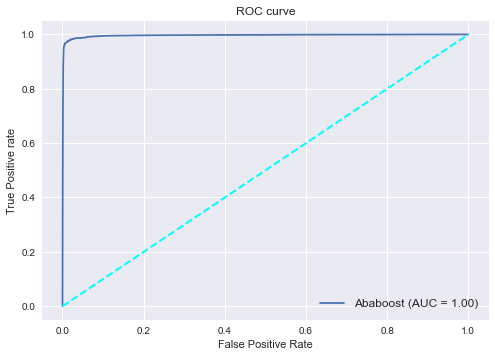

In [695]:
fpr, tpr, thresholds = roc_curve(y_test, y_probab3[:,1])
au6=auc(fpr, tpr)
plt.plot(fpr,tpr, label='Ababoost (AUC = {0:0.2f})'.format(au6))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [696]:
asc=accuracy_score(y_test,y_pred_testab3)
ps=precision_score(y_test,y_pred_testab3)
rs=recall_score(y_test,y_pred_testab3)
fs=f1_score(y_test,y_pred_testab3)
roc6=roc_auc_score(y_test,y_probab3[:,1])

In [697]:
update_metrics("Model_AdaBOOST",asc,ps,rs,fs,au6,roc6,5)

In [698]:
df_metrics2

,With SMOTE-model,Accuracy,Precision,Recall,F1 score,AUC,Roc_auc_score
0,Model_logistic,0.992388,0.997029,0.987731,0.992358,0.997383,0.997383
1,Model_Desicion-Tree,0.996697,0.994485,0.998940,0.996708,0.996695,0.996695
2,Model_Navie_Bayes,0.787578,0.765444,0.829792,0.796320,0.870246,0.870246
3,Model_Random_Forest,0.997878,0.997578,0.998182,0.997880,0.999870,0.999870
4,Model_XGBOOST,0.997921,0.997191,0.998658,0.997924,0.999683,0.999683
5,Model_AdaBOOST,0.979534,0.994246,0.964686,0.979243,0.996373,0.996373


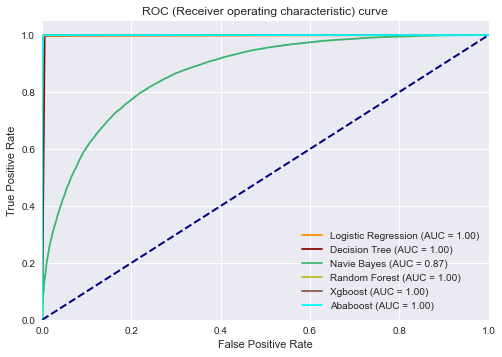

In [699]:
fpr1, tpr1, thresholds1 = roc_curve(y_test, y_problr3[:,1])
fpr2, tpr2, thresholds2 = roc_curve(y_test, y_probdt3[:,1])
fpr3, tpr3, thresholds3 = roc_curve(y_test, y_probnb3[:,1])
fpr4, tpr4, thresholds4 = roc_curve(y_test, y_probrf3[:,1])
fpr5, tpr5, thresholds6 = roc_curve(y_test, y_probxg3[:,1])
fpr6, tpr6, thresholds7 = roc_curve(y_test, y_probxg3[:,1])

plt.figure()
plt.plot(fpr1, tpr1, color='darkorange', label='Logistic Regression (AUC = {0:0.2f})'.format(au1))
plt.plot(fpr2, tpr2, color='darkred', label='Decision Tree (AUC = {0:0.2f})'.format(au2))
plt.plot(fpr3, tpr3, color='mediumseagreen', label='Navie Bayes (AUC = {0:0.2f})'.format(au3))
plt.plot(fpr4, tpr4, color='tab:olive', label='Random Forest (AUC = {0:0.2f})'.format(au4))
plt.plot(fpr5, tpr5, color='tab:brown', label='Xgboost (AUC = {0:0.2f})'.format(au5))
plt.plot(fpr6, tpr6, color='cyan', label='Ababoost (AUC = {0:0.2f})'.format(au6))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC (Receiver operating characteristic) curve')
plt.legend(loc="lower right")
plt.show()

In [164]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

In [165]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier

In [166]:
models = []

models.append(('LR', LogisticRegression()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('XGB', XGBClassifier(eval_metric='logloss')))
models.append(('RF', RandomForestClassifier()))
models.append(('ADA', AdaBoostClassifier()))
models.append(('NB', GaussianNB()))
#testing models

results = []
names = []

for name, model in models:
    kfold = KFold(n_splits=10, random_state=42,shuffle=True)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='f1')
    results.append(cv_results)
    names.append(name)
    msg = '%s: %f (%f)' % (name, cv_results.mean(), cv_results.std())
    print(msg)

LR: 0.992278 (0.000491)
KNN: 0.985914 (0.000807)
CART: 0.996470 (0.000517)
XGB: 0.997795 (0.000259)
RF: 0.997153 (0.000334)
ADA: 0.979091 (0.002117)
NB: 0.798735 (0.003241)


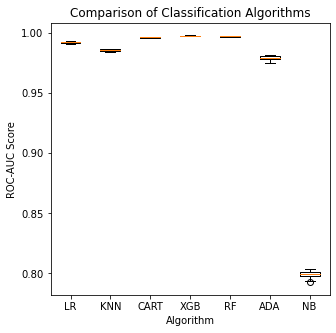

In [167]:
fig = plt.figure(figsize=(5,5))
plt.title('Comparison of Classification Algorithms')
plt.xlabel('Algorithm')
plt.ylabel('ROC-AUC Score')
plt.boxplot(results)
ax = fig.add_subplot(111)
ax.set_xticklabels(names)
plt.show()

In [168]:
log_reg_score = cross_val_score(LogisticRegression(), X_train, y_train, cv=10)
print('Logistic Regression Cross Validation Score: ', round(log_reg_score.mean() * 100, 2).astype(str) + '%')


knears_score = cross_val_score(KNeighborsClassifier(), X_train, y_train, cv=10)
print('Knears Neighbors Cross Validation Score', round(knears_score.mean() * 100, 2).astype(str) + '%')

xg_score = cross_val_score(XGBClassifier(eval_metric='logloss'), X_train, y_train, cv=10)
print('XG Boost Classifier Cross Validation Score', round(xg_score.mean() * 100, 2).astype(str) + '%')

tree_score = cross_val_score(DecisionTreeClassifier(), X_train, y_train, cv=10)
print('DecisionTree Classifier Cross Validation Score', round(tree_score.mean() * 100, 2).astype(str) + '%')

rf_score = cross_val_score(RandomForestClassifier(), X_train, y_train, cv=10)
print('Random Forest Classifier Cross Validation Score', round(rf_score.mean() * 100, 2).astype(str) + '%')

ada_score = cross_val_score(AdaBoostClassifier(), X_train, y_train, cv=10)
print('Ada Boost Classifier Cross Validation Score', round(ada_score.mean() * 100, 2).astype(str) + '%')

nb_score = cross_val_score(GaussianNB(), X_train, y_train, cv=10)
print('Navie Bayes Classifier Cross Validation Score', round(nb_score.mean() * 100, 2).astype(str) + '%')


Logistic Regression Cross Validation Score:  99.23%
Knears Neighbors Cross Validation Score 98.58%
XG Boost Classifier Cross Validation Score 99.78%
DecisionTree Classifier Cross Validation Score 99.62%
Random Forest Classifier Cross Validation Score 99.72%
Ada Boost Classifier Cross Validation Score 97.94%
Navie Bayes Classifier Cross Validation Score 79.12%


Votting

In [155]:
from sklearn.ensemble import VotingClassifier

In [156]:
rf=RandomForestClassifier()
Dt= DecisionTreeClassifier()
xg = XGBClassifier(eval_metric='logloss')

In [157]:
vot_clf = VotingClassifier(estimators = [('DT', Dt), ('RF', rf), ('XG', xg)], voting = 'hard')
vot_clf.fit(X_train, y_train)

VotingClassifier(estimators=[('DT', DecisionTreeClassifier()),
                             ('RF', RandomForestClassifier()),
                             ('XG',
                              XGBClassifier(base_score=None, booster=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None,
                                            eval_metric='logloss', gamma=None,
                                            gpu_id=None, importance_type='gain',
                                            interaction_constraints=None,
                                            learning_rate=None,
                                            max_delta_step=None, max_depth=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                               

In [158]:
pred = vot_clf.predict(X_test)

In [159]:
f1_score(y_test,pred)

0.99831409674491

In [160]:
vot_clf.score(X_test,y_test)

0.9983107559367184

In [161]:
vot_clf.score(X_train,y_train)

1.0

In [162]:
accuracy_score(y_test,pred)

0.9983107559367184

In [163]:
for model in (Dt,rf,xg,vot_clf):
    model.fit(X_train,y_train)
    prediction=model.predict(X_test)
    print(model.__class__.__name__,f1_score(y_test,prediction))

DecisionTreeClassifier 0.9968051807879115
RandomForestClassifier 0.9975331616644667
XGBClassifier 0.9978484393076081
VotingClassifier 0.9982924826006138


----------------------------------------------------------------------------------------------------------------------------

In [9]:
from sklearn.feature_selection import RFECV

In [170]:
from sklearn.tree import DecisionTreeClassifier
Dt= DecisionTreeClassifier()

In [171]:
rfecv=RFECV(Dt,cv=10,scoring='f1',n_jobs=-1)

In [172]:
rfecv.fit(X_train,y_train)

RFECV(cv=10, estimator=DecisionTreeClassifier(), n_jobs=-1, scoring='f1')

In [173]:
best_features=list(X_train.columns[rfecv.support_])

In [174]:
best_features

['loan_amnt', 'total_pymnt', 'total_rec_int']

In [10]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier()
rfecv1=RFECV(rf,cv=10,scoring='f1',n_jobs=-1)

In [ ]:
rfecv1.fit(X_train,y_train)

In [ ]:
best_features=list(X_train.columns[rfecv1.support_])
best_features

In [851]:
X3=df1[['loan_amnt', 'total_pymnt', 'total_rec_int']]

In [852]:
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter
# instantiating over and under sampler
over = RandomOverSampler()
under = RandomUnderSampler()
# first performing oversampling to minority class
X4, y4 = over.fit_resample(X3, y)
print(f"Oversampled: {Counter(y4)}")
# now to comine under sampling 
X5, y5 = under.fit_resample(X4, y4)
print(f"Combined Random Sampling: {Counter(y5)}")

Oversampled: Counter({0: 153915, 1: 153915})
Combined Random Sampling: Counter({0: 153915, 1: 153915})


In [853]:
from sklearn.model_selection import train_test_split 
X_train,X_test,y_train,y_test=train_test_split(X5,y5 ,test_size=.3,random_state=42)

In [854]:
df_metrics3=pd.DataFrame(columns=['With_Best_Featuresmodel','Accuracy','Precision','Recall','F1 score','AUC','Roc_auc_score'])
def update_metrics(m,acc,prec,rec,f1,auc,roc,i):
    df_metrics3.loc[i]=(m,acc,prec,rec,f1,auc,roc)

In [855]:
###Logistic with sklearn
from sklearn.linear_model import LogisticRegression 
Lr=LogisticRegression()
Lr.fit(X_train, y_train)
y_pred_testlr4 =Lr.predict(X_test)
y_pred_trainlr4 =Lr.predict(X_train)

In [856]:
y_problr4=Lr.predict_proba(X_test)
y_problr4

array([[9.91129283e-01, 8.87071711e-03],
       [9.99677417e-01, 3.22583453e-04],
       [1.75139903e-11, 1.00000000e+00],
       ...,
       [3.47322535e-06, 9.99996527e-01],
       [6.72812639e-02, 9.32718736e-01],
       [3.39728246e-14, 1.00000000e+00]])

In [857]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testlr4))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_trainlr4))

Test Confusion  Matrix :  
 [[46000   135]
 [  556 45658]]


Train Confusion  Matrix :  
 [[107464    316]
 [  1319 106382]]


In [858]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testlr4))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_trainlr4))

Test Classification Report :  
               precision    recall  f1-score   support

           0       0.99      1.00      0.99     46135
           1       1.00      0.99      0.99     46214

    accuracy                           0.99     92349
   macro avg       0.99      0.99      0.99     92349
weighted avg       0.99      0.99      0.99     92349

Train Classification Report :  
               precision    recall  f1-score   support

           0       0.99      1.00      0.99    107780
           1       1.00      0.99      0.99    107701

    accuracy                           0.99    215481
   macro avg       0.99      0.99      0.99    215481
weighted avg       0.99      0.99      0.99    215481



In [859]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_trainlr4),end="      ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testlr4))
print('Train Precision : ', precision_score(y_train,y_pred_trainlr4),end="     ")
print('Test Precision : ', precision_score(y_test,y_pred_testlr4))
print('Train Recall : ', recall_score(y_train,y_pred_trainlr4),end="        ")
print('Test Recall : ', recall_score(y_test,y_pred_testlr4))

Train Accuracy :  0.9924123240564133      Test Accuracy :  0.9925175150786689
Train Precision :  0.9970383699788187     Test Precision :  0.9970519511715764
Train Recall :  0.9877531313543978        Test Recall :  0.9879690137187865


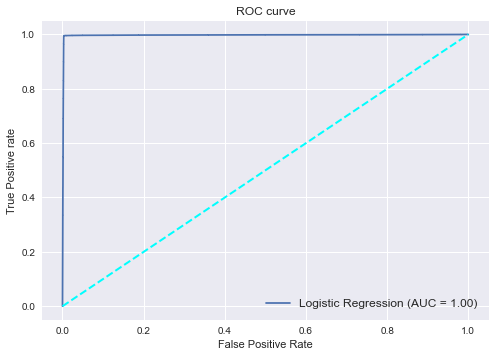

In [860]:
fpr, tpr, thresholds = roc_curve(y_test, y_problr4[:,1])
au1=auc(fpr, tpr)
plt.plot(fpr,tpr, label='Logistic Regression (AUC = {0:0.2f})'.format(au1))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [861]:
asc=accuracy_score(y_test,y_pred_testlr4)
ps=precision_score(y_test,y_pred_testlr4)
rs=recall_score(y_test,y_pred_testlr4)
fs=f1_score(y_test,y_pred_testlr4)
roc1=roc_auc_score(y_test,y_problr4[:,1])

In [862]:
update_metrics("Model_logistic",asc,ps,rs,fs,au1,roc1,0)

In [863]:
###Decesion Tree
from sklearn.tree import DecisionTreeClassifier
Dt= DecisionTreeClassifier()
Dt.fit(X_train,y_train)
y_pred_testdt4 = Dt.predict(X_test)
y_pred_traindt4 =Dt.predict(X_train)

In [864]:
y_probdt4=Dt.predict_proba(X_test)
y_probdt4

array([[1., 0.],
       [1., 0.],
       [0., 1.],
       ...,
       [0., 1.],
       [0., 1.],
       [0., 1.]])

In [865]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testdt4))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_traindt4))

Test Confusion  Matrix :  
 [[45955   180]
 [   35 46179]]


Train Confusion  Matrix :  
 [[107775      5]
 [    12 107689]]


In [866]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testdt4))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_traindt4))

Test Classification Report :  
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     46135
           1       1.00      1.00      1.00     46214

    accuracy                           1.00     92349
   macro avg       1.00      1.00      1.00     92349
weighted avg       1.00      1.00      1.00     92349

Train Classification Report :  
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    107780
           1       1.00      1.00      1.00    107701

    accuracy                           1.00    215481
   macro avg       1.00      1.00      1.00    215481
weighted avg       1.00      1.00      1.00    215481



In [867]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_traindt4),end="              ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testdt4))
print('Train Precision : ', precision_score(y_train,y_pred_traindt4),end="             ")
print('Test Precision : ', precision_score(y_test,y_pred_testdt4))
print('Train Recall : ', recall_score(y_train,y_pred_traindt4),end="                ")
print('Test Recall : ', recall_score(y_test,y_pred_testdt4))

Train Accuracy :  0.9999211067333083              Test Accuracy :  0.9976718751691951
Train Precision :  0.9999535721581518             Test Precision :  0.996117258784702
Train Recall :  0.9998885804217231                Test Recall :  0.9992426537412905


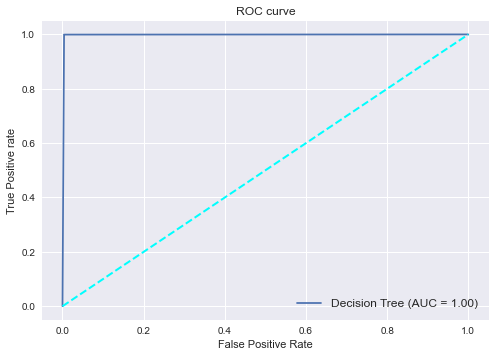

In [868]:
fpr, tpr, thresholds = roc_curve(y_test, y_probdt4[:,1])
au2=auc(fpr, tpr)
plt.plot(fpr,tpr, label='Decision Tree (AUC = {0:0.2f})'.format(au2))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [869]:
asc=accuracy_score(y_test,y_pred_testdt4)
ps=precision_score(y_test,y_pred_testdt4)
rs=recall_score(y_test,y_pred_testdt4)
fs=f1_score(y_test,y_pred_testdt4)
roc2=roc_auc_score(y_test,y_probdt4[:,1])

In [870]:
update_metrics("Model_Desicion-Tree",asc,ps,rs,fs,au2,roc2,1)

In [871]:
###Navie Bayes
from sklearn.naive_bayes import GaussianNB
nb=GaussianNB()
nb.fit(X_train,y_train)
y_pred_testnb4 = nb.predict(X_test)
y_pred_trainnb4 = nb.predict(X_train)

In [872]:
y_probnb4=nb.predict_proba(X_test)
y_probnb4

array([[0.99363828, 0.00636172],
       [0.98455773, 0.01544227],
       [0.20159769, 0.79840231],
       ...,
       [0.37677526, 0.62322474],
       [0.25520822, 0.74479178],
       [0.19929058, 0.80070942]])

In [873]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testnb4))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_trainnb4))

Test Confusion  Matrix :  
 [[28313 17822]
 [ 3724 42490]]


Train Confusion  Matrix :  
 [[66228 41552]
 [ 8999 98702]]


In [874]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testnb4))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_trainnb4))

Test Classification Report :  
               precision    recall  f1-score   support

           0       0.88      0.61      0.72     46135
           1       0.70      0.92      0.80     46214

    accuracy                           0.77     92349
   macro avg       0.79      0.77      0.76     92349
weighted avg       0.79      0.77      0.76     92349

Train Classification Report :  
               precision    recall  f1-score   support

           0       0.88      0.61      0.72    107780
           1       0.70      0.92      0.80    107701

    accuracy                           0.77    215481
   macro avg       0.79      0.77      0.76    215481
weighted avg       0.79      0.77      0.76    215481



In [875]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_trainnb4),end="            ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testnb4))
print('Train Precision : ', precision_score(y_train,y_pred_trainnb4),end="           ")
print('Test Precision : ', precision_score(y_test,y_pred_testnb4))
print('Train Recall : ', recall_score(y_train,y_pred_trainnb4),end="              ")
print('Test Recall : ', recall_score(y_test,y_pred_testnb4))

Train Accuracy :  0.7654039103215596            Test Accuracy :  0.7666894064905955
Train Precision :  0.7037375048126969           Test Precision :  0.7045032497678737
Train Recall :  0.9164446012571842              Test Recall :  0.9194183580733111


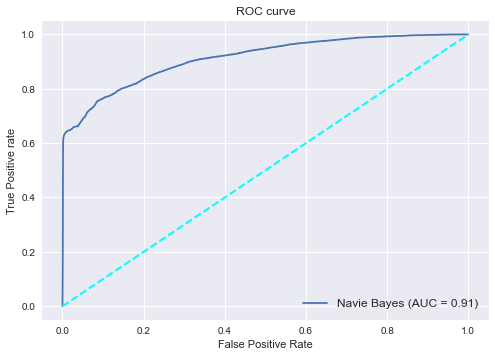

In [876]:
fpr, tpr, thresholds = roc_curve(y_test, y_probnb4[:,1])
au3=auc(fpr, tpr)
plt.plot(fpr,tpr, label='Navie Bayes (AUC = {0:0.2f})'.format(au3))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [877]:
asc=accuracy_score(y_test,y_pred_testnb4)
ps=precision_score(y_test,y_pred_testnb4)
rs=recall_score(y_test,y_pred_testnb4)
fs=f1_score(y_test,y_pred_testnb4)
roc3=roc_auc_score(y_test,y_probnb4[:,1])

In [878]:
update_metrics("Model_Navie_Bayes",asc,ps,rs,fs,au3,roc3,2)

In [879]:
###Random Forest
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier()
rf.fit(X_train, y_train)
y_pred_testrf4= rf.predict(X_test)
y_pred_trainrf4 = rf.predict(X_train)

In [880]:
y_probrf4=rf.predict_proba(X_test)
y_probrf4

array([[0.96, 0.04],
       [1.  , 0.  ],
       [0.  , 1.  ],
       ...,
       [0.  , 1.  ],
       [0.  , 1.  ],
       [0.  , 1.  ]])

In [881]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testrf4))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_trainrf4))

Test Confusion  Matrix :  
 [[45995   140]
 [   15 46199]]


Train Confusion  Matrix :  
 [[107774      6]
 [    12 107689]]


In [882]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testrf4))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_trainrf4))

Test Classification Report :  
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     46135
           1       1.00      1.00      1.00     46214

    accuracy                           1.00     92349
   macro avg       1.00      1.00      1.00     92349
weighted avg       1.00      1.00      1.00     92349

Train Classification Report :  
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    107780
           1       1.00      1.00      1.00    107701

    accuracy                           1.00    215481
   macro avg       1.00      1.00      1.00    215481
weighted avg       1.00      1.00      1.00    215481



In [883]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_trainrf4),end="    ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testrf4))
print('Train Precision : ', precision_score(y_train,y_pred_trainrf4),end="   ")
print('Test Precision : ', precision_score(y_test,y_pred_testrf4))
print('Train Recall : ', recall_score(y_train,y_pred_trainrf4),end="      ")
print('Test Recall : ', recall_score(y_test,y_pred_testrf4))

Train Accuracy :  0.9999164659529146    Test Accuracy :  0.9983215844243034
Train Precision :  0.999944287107108   Test Precision :  0.9969787867670861
Train Recall :  0.9998885804217231      Test Recall :  0.9996754230319816


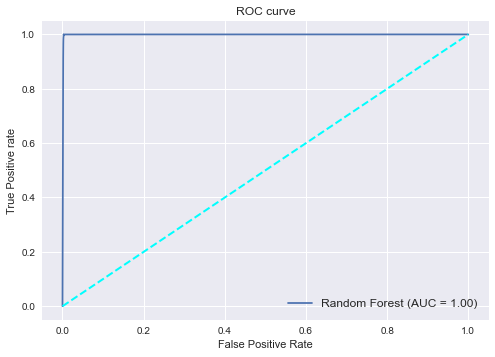

In [884]:
fpr, tpr, thresholds = roc_curve(y_test, y_probrf4[:,1])
au4=auc(fpr, tpr)
plt.plot(fpr,tpr, label='Random Forest (AUC = {0:0.2f})'.format(au4))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [885]:
asc=accuracy_score(y_test,y_pred_testrf4)
ps=precision_score(y_test,y_pred_testrf4)
rs=recall_score(y_test,y_pred_testrf4)
fs=f1_score(y_test,y_pred_testrf4)
roc4=roc_auc_score(y_test,y_probrf4[:,1])

In [886]:
update_metrics("Model_Random_Forest",asc,ps,rs,fs,au4,roc4,3)

In [887]:
###Xgboost
from xgboost import XGBClassifier
xg = XGBClassifier(eval_metric='logloss')
xg.fit(X_train, y_train)
y_pred_testxg4 = xg.predict(X_test)
y_pred_trainxg4 = xg.predict(X_train)

In [888]:
y_probxg4=xg.predict_proba(X_test)
y_probxg4

array([[9.9563724e-01, 4.3627652e-03],
       [9.8981869e-01, 1.0181319e-02],
       [2.9450655e-03, 9.9705493e-01],
       ...,
       [1.7316341e-03, 9.9826837e-01],
       [9.3716383e-04, 9.9906284e-01],
       [9.8323822e-04, 9.9901676e-01]], dtype=float32)

In [889]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testxg4))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_trainxg4))

Test Confusion  Matrix :  
 [[45999   136]
 [  141 46073]]


Train Confusion  Matrix :  
 [[107464    316]
 [   293 107408]]


In [890]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testxg4))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_trainxg4))

Test Classification Report :  
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     46135
           1       1.00      1.00      1.00     46214

    accuracy                           1.00     92349
   macro avg       1.00      1.00      1.00     92349
weighted avg       1.00      1.00      1.00     92349

Train Classification Report :  
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    107780
           1       1.00      1.00      1.00    107701

    accuracy                           1.00    215481
   macro avg       1.00      1.00      1.00    215481
weighted avg       1.00      1.00      1.00    215481



In [891]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_trainxg4),end="     ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testxg4))
print('Train Precision : ', precision_score(y_train,y_pred_trainxg4),end="    ")
print('Test Precision : ', precision_score(y_test,y_pred_testxg4))
print('Train Recall : ', recall_score(y_train,y_pred_trainxg4),end="       ")
print('Test Recall : ', recall_score(y_test,y_pred_testxg4))

Train Accuracy :  0.9971737647402787     Test Accuracy :  0.9970005089389165
Train Precision :  0.9970665775500352    Test Precision :  0.9970568503971088
Train Recall :  0.9972795052970724       Test Recall :  0.9969489765006275


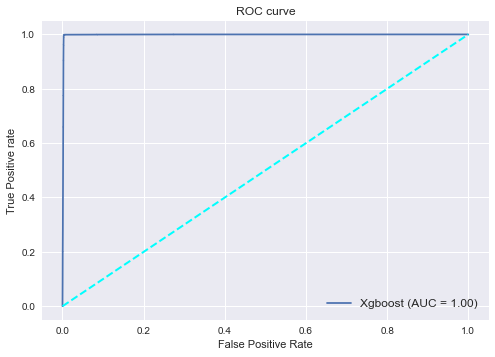

In [892]:
fpr, tpr, thresholds = roc_curve(y_test, y_probxg4[:,1])
au5=auc(fpr, tpr)
plt.plot(fpr,tpr, label='Xgboost (AUC = {0:0.2f})'.format(au5))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [893]:
asc=accuracy_score(y_test,y_pred_testxg4)
ps=precision_score(y_test,y_pred_testxg4)
rs=recall_score(y_test,y_pred_testxg4)
fs=f1_score(y_test,y_pred_testxg4)
roc5=roc_auc_score(y_test,y_probxg4[:,1])

In [894]:
update_metrics("Model_XGBOOST",asc,ps,rs,fs,au5,roc5,4)

In [895]:
from sklearn.ensemble import AdaBoostClassifier
ab= AdaBoostClassifier()
ab.fit(X_train, y_train)
y_pred_testab4= ab.predict(X_test)
y_pred_trainab4 = ab.predict(X_train)

In [896]:
y_probab4=ab.predict_proba(X_test)
y_probab4

array([[0.50274691, 0.49725309],
       [0.52652193, 0.47347807],
       [0.4681897 , 0.5318103 ],
       ...,
       [0.4920876 , 0.5079124 ],
       [0.49253072, 0.50746928],
       [0.45443081, 0.54556919]])

In [897]:
print('Test Confusion  Matrix : ','\n' ,confusion_matrix(y_test,y_pred_testab4))
print('\n')
print('Train Confusion  Matrix : ','\n',confusion_matrix(y_train,y_pred_trainab4))

Test Confusion  Matrix :  
 [[45905   230]
 [ 1954 44260]]


Train Confusion  Matrix :  
 [[107246    534]
 [  4711 102990]]


In [898]:
print('Test Classification Report : ' ,'\n',classification_report(y_test,y_pred_testab4))
print('Train Classification Report : ' ,'\n',classification_report(y_train,y_pred_trainab4))

Test Classification Report :  
               precision    recall  f1-score   support

           0       0.96      1.00      0.98     46135
           1       0.99      0.96      0.98     46214

    accuracy                           0.98     92349
   macro avg       0.98      0.98      0.98     92349
weighted avg       0.98      0.98      0.98     92349

Train Classification Report :  
               precision    recall  f1-score   support

           0       0.96      1.00      0.98    107780
           1       0.99      0.96      0.98    107701

    accuracy                           0.98    215481
   macro avg       0.98      0.98      0.98    215481
weighted avg       0.98      0.98      0.98    215481



In [899]:
print('Train Accuracy : ', accuracy_score(y_train,y_pred_trainab4),end="    ")
print('Test Accuracy : ', accuracy_score(y_test,y_pred_testab4))
print('Train Precision : ', precision_score(y_train,y_pred_trainab4),end="    ")
print('Test Precision : ', precision_score(y_test,y_pred_testab4))
print('Train Recall : ', recall_score(y_train,y_pred_trainab4),end="      ")
print('Test Recall : ', recall_score(y_test,y_pred_testab4))

Train Accuracy :  0.9756591068354055    Test Accuracy :  0.9763505831140564
Train Precision :  0.9948417758200997    Test Precision :  0.9948302989435829
Train Recall :  0.9562585305614618      Test Recall :  0.9577184402994764


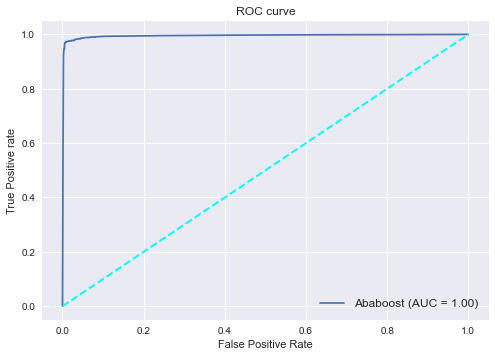

In [900]:
fpr, tpr, thresholds = roc_curve(y_test, y_probab4[:,1])
au6=auc(fpr, tpr)
plt.plot(fpr,tpr, label='Ababoost (AUC = {0:0.2f})'.format(au6))
plt.plot([0, 1], [0, 1], color='cyan', lw=2, linestyle='--')
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')
plt.legend(loc="lower right",fontsize='large')
plt.show()

In [901]:
asc=accuracy_score(y_test,y_pred_testab4)
ps=precision_score(y_test,y_pred_testab4)
rs=recall_score(y_test,y_pred_testab4)
fs=f1_score(y_test,y_pred_testab4)
roc6=roc_auc_score(y_test,y_probab4[:,1])

In [902]:
update_metrics("Model_AdaBOOST",asc,ps,rs,fs,au6,roc6,5)

In [903]:
df_metrics3

,With_Best_Featuresmodel,Accuracy,Precision,Recall,F1 score,AUC,Roc_auc_score
0,Model_logistic,0.992518,0.997052,0.987969,0.992490,0.997009,0.997009
1,Model_Desicion-Tree,0.997672,0.996117,0.999243,0.997678,0.997729,0.997729
2,Model_Navie_Bayes,0.766689,0.704503,0.919418,0.797740,0.912048,0.912048
3,Model_Random_Forest,0.998322,0.996979,0.999675,0.998325,0.999018,0.999018
4,Model_XGBOOST,0.997001,0.997057,0.996949,0.997003,0.998529,0.998529
5,Model_AdaBOOST,0.976351,0.994830,0.957718,0.975922,0.995088,0.995088


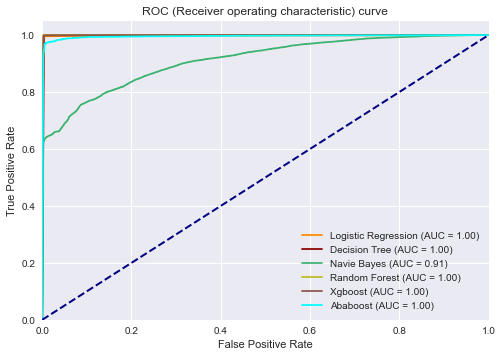

In [904]:
fpr1, tpr1, thresholds1 = roc_curve(y_test, y_problr4[:,1])
fpr2, tpr2, thresholds2 = roc_curve(y_test, y_probdt4[:,1])
fpr3, tpr3, thresholds3 = roc_curve(y_test, y_probnb4[:,1])
fpr4, tpr4, thresholds4 = roc_curve(y_test, y_probrf4[:,1])
fpr5, tpr5, thresholds6 = roc_curve(y_test, y_probxg4[:,1])
fpr6, tpr6, thresholds7 = roc_curve(y_test, y_probab4[:,1])

plt.figure()
plt.plot(fpr1, tpr1, color='darkorange', label='Logistic Regression (AUC = {0:0.2f})'.format(au1))
plt.plot(fpr2, tpr2, color='darkred', label='Decision Tree (AUC = {0:0.2f})'.format(au2))
plt.plot(fpr3, tpr3, color='mediumseagreen', label='Navie Bayes (AUC = {0:0.2f})'.format(au3))
plt.plot(fpr4, tpr4, color='tab:olive', label='Random Forest (AUC = {0:0.2f})'.format(au4))
plt.plot(fpr5, tpr5, color='tab:brown', label='Xgboost (AUC = {0:0.2f})'.format(au5))
plt.plot(fpr6, tpr6, color='cyan', label='Ababoost (AUC = {0:0.2f})'.format(au6))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC (Receiver operating characteristic) curve')
plt.legend(loc="lower right")
plt.show()

In [905]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

In [906]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier

In [907]:
models = []

models.append(('LR', LogisticRegression()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('XGB', XGBClassifier(eval_metric='logloss')))
models.append(('RF', RandomForestClassifier()))
models.append(('ADA', AdaBoostClassifier()))
models.append(('NB', GaussianNB()))
#testing models

results = []
names = []

for name, model in models:
    kfold = KFold(n_splits=10, random_state=42,shuffle=True)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='f1')
    results.append(cv_results)
    names.append(name)
    msg = '%s: %f (%f)' % (name, cv_results.mean(), cv_results.std())
    print(msg)

LR: 0.992830 (0.000542)
CART: 0.997370 (0.000236)
XGB: 0.996599 (0.000495)
RF: 0.998056 (0.000224)
ADA: 0.974539 (0.001458)
NB: 0.796093 (0.002638)


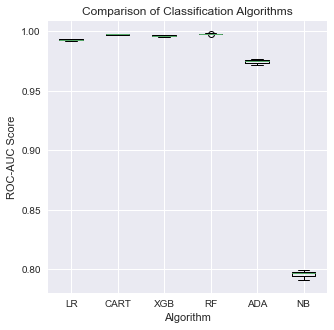

In [908]:
fig = plt.figure(figsize=(5,5))
plt.title('Comparison of Classification Algorithms')
plt.xlabel('Algorithm')
plt.ylabel('ROC-AUC Score')
plt.boxplot(results)
ax = fig.add_subplot(111)
ax.set_xticklabels(names)
plt.show()

In [909]:
log_reg_score = cross_val_score(LogisticRegression(), X_train, y_train, cv=10)
print('Logistic Regression Cross Validation Score: ', round(log_reg_score.mean() * 100, 2).astype(str) + '%')

xg_score = cross_val_score(XGBClassifier(eval_metric='logloss'), X_train, y_train, cv=10)
print('XG Boost Classifier Cross Validation Score', round(xg_score.mean() * 100, 2).astype(str) + '%')

tree_score = cross_val_score(DecisionTreeClassifier(), X_train, y_train, cv=10)
print('DecisionTree Classifier Cross Validation Score', round(tree_score.mean() * 100, 2).astype(str) + '%')

rf_score = cross_val_score(RandomForestClassifier(), X_train, y_train, cv=10)
print('Random Forest Classifier Cross Validation Score', round(rf_score.mean() * 100, 2).astype(str) + '%')

ada_score = cross_val_score(AdaBoostClassifier(), X_train, y_train, cv=10)
print('Ada Boost Classifier Cross Validation Score', round(ada_score.mean() * 100, 2).astype(str) + '%')

nb_score = cross_val_score(GaussianNB(), X_train, y_train, cv=10)
print('Navie Bayes Classifier Cross Validation Score', round(nb_score.mean() * 100, 2).astype(str) + '%')


Logistic Regression Cross Validation Score:  99.27%
XG Boost Classifier Cross Validation Score 99.66%
DecisionTree Classifier Cross Validation Score 99.73%
Random Forest Classifier Cross Validation Score 99.81%
Ada Boost Classifier Cross Validation Score 97.61%
Navie Bayes Classifier Cross Validation Score 76.54%


Votting

In [910]:
from sklearn.ensemble import VotingClassifier

In [911]:
rf=RandomForestClassifier()
Dt= DecisionTreeClassifier()
xg = XGBClassifier(eval_metric='logloss')

In [912]:
vot_clf = VotingClassifier(estimators = [('DT', Dt), ('RF', rf), ('XG', xg)], voting = 'hard')
vot_clf.fit(X_train, y_train)

VotingClassifier(estimators=[('DT', DecisionTreeClassifier()),
                             ('RF', RandomForestClassifier()),
                             ('XG',
                              XGBClassifier(base_score=None, booster=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None,
                                            eval_metric='logloss', gamma=None,
                                            gpu_id=None, importance_type='gain',
                                            interaction_constraints=None,
                                            learning_rate=None,
                                            max_delta_step=None, max_depth=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                               

In [913]:
pred = vot_clf.predict(X_test)

In [914]:
f1_score(y_test,pred)

0.9983468574083479

In [916]:
vot_clf.score(X_train,y_train)

0.9999164659529146

In [917]:
accuracy_score(y_test,pred)

0.9983432413994737

In [918]:
for model in (Dt,rf,xg,vot_clf):
    model.fit(X_train,y_train)
    prediction=model.predict(X_test)
    print(model.__class__.__name__,f1_score(y_test,prediction))

DecisionTreeClassifier 0.9976560052712877
RandomForestClassifier 0.9983144974825507
XGBClassifier 0.9970029105309285
VotingClassifier 0.9983252115095786
